https://sejaumdatascientist.com/como-criar-um-programa-de-fidelidade-para-empresa/

# Cicle

### Cicle 01
- Foundout 3 potencial clusters using the data as it is.

Next cicles:
- Need to make some feature engineering
- Deal with NA values
- Run others clustering algorithms

### Cicle 02
- Data is still messy. Got a similar cluster as cicle 01.
- Dealt with NA values
- Have runned other clustering algorithms to find a optimal cluster

Next cicles:
- Need to make some feature engineering

### Cicle 03
- Created 3 clusters and the average gross revenue adjusted seems to be more acurate then the previous circle.
- The data have been separeted in "good return", "qtd adjustment", "free purchase" and "normal purchase". It was possible to identify strange information in the data and it was treated creating new features.

Next cicles:
- Futher investigation on description / stock_code to "break" the hude cluster
- Data of purchase need to be analyzed to create new features
- The last cicles indicated some anomaly with customer with 0 or negative total purchase adjusted. Since we are not interested in this behaviour, we are going to remove it.

### Cicle 04
- This cicles we explored the "describe" columns with several features counting the frequency of each word.
- It was possible to create a cluster with most of people spending in avg $157.460,93 with 6 customers. But it didn´t capture the most speding customers, because there are a few in other clusters.

Next cicles:
- Data of purchase need to be analyzed to create new features
- Make a analyzis on the space using PCA or UMAP.

### Cicle 05
- "Date" feature has been developed creating new features.

Next cicles:
- Make a analyzis on the space using PCA or UMAP.



# 0.0. Planejamento da Solução ( IOT )

## Input - Entrada

### O problema de negócio

1. Selecionar os mais valiosos clientes para formar o programa de fidelidade **"INSIDERS"**
2. Conjunto de dados com as vendas de produtos durante 1 ano ( Nov 2015 to Dec 2017 )

## Output - Saída

1. A indicação de pessoas para fazer parte do programa de fidelidade **"INSIDERS"**.
2. Relatório com as respostas para as seguintes perguntas:
    - Quem são as pessoas elegíveis para participar do programa de Insiders ?
    - Quantos clientes farão parte do grupo?
    - Quais as principais características desses clientes ?
    - Qual a porcentagem de contribuição do faturamento, vinda do Insiders ?
    - Qual a expectativa de faturamento desse grupo para os próximos meses ?
    - Quais as condições para uma pessoa ser elegível ao Insiders ?
    - Quais as condições para uma pessoa ser removida do Insiders ?
    - Qual a garantia que o programa Insiders é melhor que o restante da base ?
    - Quais ações o time de marketing pode realizar para aumentar o faturamento?

## Tasks - Processo

1. **Quem são as pessoas elegíveis para participar do programa de Insiders ?**
    - O que é ser elegível ? O que é um cliente "valioso" para a empresa ?
        - Faturamento:
            - **Alto Ticket Médio**
                + média dos preços pagos
            - **Alto LTV (life time value)**
                + quanto foi gasto na empresa
            - **Baixa Recência ou Alta Frequência**
                + tempo entre as compras - contado em dias
            - **Alto Basket Size**
                + quantidade média de produtos comprados
            - **Baixa probabilidade de Churn**
                + encerramento de contrato ou baixa da relação com a empresa
            - **Previsão alta de LTV**
            - **Alta propensão de compra**

        - Custo:
            - Baixo número de devoluções

        - Experiência:  
            - Média alta de avaliações
            
            
2. **Quantos clientes farão parte do grupo?**
    - Número de clientes
    - % em relação ao total de clients
    
    
3. **Quais as principais características desses clientes ?**
    - Escrever os principais atributos dos clientes
        - Idade
        - País / Localização
        - Salário
        
    - Escrever os principais comportamentos de compra dos clients ( métricas de negócio )
        - Atributos da clusterização / Vide acima
    
    
4. **Qual a porcentagem de contribuição do faturamento, vinda do Insiders ?**
    - Calcular o faturamento total da empresa durante o ano.
    - Calcular o faturamento (%) apenas do cluster Insiders.
    
    
5. **Qual a expectativa de faturamento desse grupo para os próximos meses ?**
    - Cálculo do LTV do grupo Insiders
    - Análise de Cohort (marcação do grupo e seu comportamento ao longo do tempo)
    - Séries Temporais ( ARMA, ARIMA, HoltWinter, etc )
    

6. **Quais as condições para uma pessoa ser elegível ao Insiders ?**
    - Qual o período de avaliação ? (1 mês, 3 meses...?)
    - O "desempenho" do cliente está próximo da média do cluster Insiders. 
    
    
7. **Quais as condições para uma pessoa ser removida do Insiders ?**
    - O "desempenho" do cliente não está mais próximo da média do cluster Insiders. 
    
    
8. **Qual a garantia que o programa Insiders é melhor que o restante da base ?**
    - Teste de Hipóteses
    - Teste A/B
    
    
9. **Quais ações o time de marketing pode realizar para aumentar o faturamento?**
    - Descontos
    - Preferências de escolha
    - Produtos exclusivos

# 0.0. Imports

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import inflection
import sklearn
import yellowbrick
import umap.umap_ as umap
from matplotlib import pyplot as plt

from pandas_profiling import ProfileReport

import nltk
from nltk.tokenize import RegexpTokenizer

from IPython.core.display import HTML
from sklearn import cluster as c
from sklearn import metrics as m
from sklearn import preprocessing as pp
from sklearn import decomposition as dd
from sklearn import mixture       as mx
from sklearn.manifold import TSNE
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from plotly import express as px

## 0.1. Helper Functions

In [2]:
def jupyter_settings():
    %matplotlib inline
    %pylab inline
    
    plt.style.use( 'ggplot')
    plt.rcParams['figure.figsize'] = [24, 9]
    plt.rcParams['font.size'] = 24
    
    display( HTML( '<style>.container { width:100% !important; }</style>') )
    pd.options.display.max_columns = None
    pd.options.display.max_rows = None
    pd.set_option( 'display.expand_frame_repr', False )
    
    sns.set()
    
jupyter_settings()

def describe_num(num_attributes):
    a = num_attributes.describe().T.reset_index()
    
    d4 = pd.DataFrame(num_attributes.apply( lambda x: x.max() - x.min())).T
    d5 = pd.DataFrame(num_attributes.apply( lambda x: x.skew())).T      
    d6 = pd.DataFrame(num_attributes.apply( lambda x: x.kurtosis())).T
    d7 = pd.DataFrame(num_attributes.apply( lambda x: x.unique().shape[0])).T
    
    n = pd.concat([d4, d5, d6, d7], axis=0).T.reset_index()
    n.columns = ['attibutes', 'range', 'skew', 'kurtosis', 'unique']
    b = a.merge(n, right_on='attibutes', left_on='index')
    b.drop('index', axis=1, inplace=True)
    columns = ['attibutes', 'count', 'mean', 'std', '25%', '50%', '75%', 'min', 'max', 'range',
           'skew', 'kurtosis', 'unique']
    return b[columns]

pd.options.display.float_format = '{:.2f}'.format

Populating the interactive namespace from numpy and matplotlib


## 0.2. Load dataset

In [3]:
# load data
df_raw = pd.read_csv('../data/raw/Ecommerce.csv',encoding='unicode_escape')

# drop extra columns
df_raw.drop('Unnamed: 8', axis=1, inplace=True)

# <font color='red'> 1.0. Descrição dos dados </font>

In [4]:
df1 = df_raw.copy()
df1.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,29-Nov-16,2.55,17850.00,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,29-Nov-16,3.39,17850.00,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,29-Nov-16,2.75,17850.00,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,29-Nov-16,3.39,17850.00,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,29-Nov-16,3.39,17850.00,United Kingdom


## 1.1. Rename columuns

In [7]:
df1.columns

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country'],
      dtype='object')

In [5]:
# storing columns names
cols_old = ['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country']

# transforming to underscore the names and put into lowcase
snakecase = lambda x: inflection.underscore( x )

# creating a list with a new snakecase columns name and indicating the new one
cols_new = list( map( snakecase, cols_old ) )

#renaming columns name
df1.columns = cols_new

## 1.2. Data dimensions

In [6]:
df1.shape

(541909, 8)

## 1.3. Data types

In [6]:
df1['invoice_date'] = pd.to_datetime(df1['invoice_date'], format='%d-%b-%y')
df1.dtypes

invoice_no              object
stock_code              object
description             object
quantity                 int64
invoice_date    datetime64[ns]
unit_price             float64
customer_id            float64
country                 object
dtype: object

## 1.4. Check NA

In [7]:
df1.isna().sum()

invoice_no           0
stock_code           0
description       1454
quantity             0
invoice_date         0
unit_price           0
customer_id     135080
country              0
dtype: int64

## 1.5. Replace NA

### 1.5.1 Description

In [7]:
# replace with existing description by stock_code
df1aux = df1[~df1['description'].isna()]
aux3 = df1aux[['stock_code', 'description']].drop_duplicates('stock_code')
df1 = df1.drop(columns='description')
df1_ = pd.merge(df1, aux3, how='left', on='stock_code')
df1_.isna().sum()

invoice_no           0
stock_code           0
quantity             0
invoice_date         0
unit_price           0
customer_id     135080
country              0
description        112
dtype: int64

In [8]:
# the remaing 112 records have 0 values for unit_price. it is going to bel erased
df1_ = df1_.dropna(subset=['description'])

df1 = df1_.copy()

df1_.isna().sum()

invoice_no           0
stock_code           0
quantity             0
invoice_date         0
unit_price           0
customer_id     134968
country              0
description          0
dtype: int64

### 1.5.2 Customer ID 

In [9]:
df1['customer_id'].isna().sum()/df1.shape[0]

0.24911175218762746

In [9]:
aux_na = df1[df1['customer_id'].isna()].copy()
aux_na['gross_revenue_na'] = aux_na['unit_price']*aux_na['quantity']
print("Total Gross Revenue NA $ %.2f" % aux_na['gross_revenue_na'].sum())
aux = df1[~df1['customer_id'].isna()].copy()
aux['gross_revenue_na'] = aux['unit_price']*aux['quantity']
print("Total Gross Revenue $ %.2f" % aux['gross_revenue_na'].sum())
print("Percentage of Total (not NA): %.2f" % (aux_na['gross_revenue_na'].sum()/aux['gross_revenue_na'].sum()*100), '%')

Total Gross Revenue NA $ 1447682.12
Total Gross Revenue $ 8300065.81
Percentage of Total (not NA): 17.44 %


In [10]:
df1_ = df1.copy()
df1_.shape

(541797, 8)

In [11]:
# create reference - artificial customer to not drop the records
df_backup = pd.DataFrame( aux_na['invoice_no'].drop_duplicates() )
df_backup['customer_id'] = np.arange( 30000, 30000+len( df_backup ), 1) 

# merge original with reference dataframe
df1_ = pd.merge( df1_, df_backup, on='invoice_no', how='left' )

# coalesce (command from SQL)
df1_['customer_id'] = df1_['customer_id_x'].combine_first( df1_['customer_id_y'] )

# drop extra columns
df1_ = df1_.drop( columns=['customer_id_x', 'customer_id_y'], axis=1 )

In [12]:
df1 = df1_.copy()
df1_.isna().sum()

invoice_no      0
stock_code      0
quantity        0
invoice_date    0
unit_price      0
country         0
description     0
customer_id     0
dtype: int64

## 1.6. Change dtypes

In [13]:
# customer_id
df1['customer_id'] = df1['customer_id'].astype('int32')
df1['quantity'] = df1['quantity'].astype('int32')
df1.dtypes

invoice_no              object
stock_code              object
quantity                 int32
invoice_date    datetime64[ns]
unit_price             float64
country                 object
description             object
customer_id              int32
dtype: object

## 1.7. Descriptive Statistics

In [16]:
num_attributes = df1.select_dtypes(include=['int32', 'float64'])
cat_attributes = df1.select_dtypes(exclude=['int32', 'float64', 'datetime64[ns]'])

### 1.7.1. Numerical Attibutes

In [17]:
describe_num(num_attributes)

,attibutes,count,mean,std,25%,50%,75%,min,max,range,skew,kurtosis,unique
0,quantity,541797.0,9.555919,218.103428,1.00,3.00,10.00,-80995.00,80995.0,161990.00,-0.264100,119744.998246,722.0
1,unit_price,541797.0,4.612067,96.769831,1.25,2.08,4.13,-11062.06,38970.0,50032.06,186.487799,58993.571524,1630.0
2,customer_id,541797.0,19408.827880,7330.497961,14367.00,16245.00,18283.00,12346.00,33597.0,21251.00,1.041805,-0.681252,7970.0


**quantity** - There is some strange values in the max and min values. Need further investigation

**unit_price** - There is some product with price equals 0 and a max values of 38.970. Need further investigation

### 1.7.2. Categorical Attibutes

In [115]:
cat_attributes.apply( lambda x: x.unique().shape[0])

invoice_no     25788
stock_code      3958
country           38
description     3817
dtype: int64

# <font color='red'> 2.0. Feature Engineering </font>

In [14]:
df2 = df1.copy()
df2.columns

Index(['invoice_no', 'stock_code', 'quantity', 'invoice_date', 'unit_price',
       'country', 'description', 'customer_id'],
      dtype='object')

In [15]:
df2.head()

,invoice_no,stock_code,quantity,invoice_date,unit_price,country,description,customer_id
0,536365,85123A,6,2016-11-29,2.55,United Kingdom,WHITE HANGING HEART T-LIGHT HOLDER,17850
1,536365,71053,6,2016-11-29,3.39,United Kingdom,WHITE METAL LANTERN,17850
2,536365,84406B,8,2016-11-29,2.75,United Kingdom,CREAM CUPID HEARTS COAT HANGER,17850
3,536365,84029G,6,2016-11-29,3.39,United Kingdom,KNITTED UNION FLAG HOT WATER BOTTLE,17850
4,536365,84029E,6,2016-11-29,3.39,United Kingdom,RED WOOLLY HOTTIE WHITE HEART.,17850


### 2.1. GROSS REVENUE

In [16]:
# gross revenue
df2['gross_revenue'] = df2['unit_price'] * df2['quantity']

### 2.2. GOOD RETURN

In [17]:
df2['good_return'] = df2.apply(lambda x: 1 if (x['quantity'] < 0) & (x['unit_price'] > 0) else 0, axis=1)

### 2.3. QNTD ADJUSTMENT

In [18]:
df2['qtd_adjustment'] = df2.apply(lambda x: 1 if (x['quantity'] < 0) & (x['unit_price'] == 0) else 0, axis=1)

### 2.4. FREE PURCHASE

In [19]:
df2['free_purchase'] = df2.apply(lambda x: 1 if (x['quantity'] > 0) & (x['unit_price'] == 0) else 0, axis=1)

### 2.5. NORMAL PURCHASE

In [20]:
df2['normal_purchase'] = df2.apply(lambda x: 1 if (x['quantity'] > 0) & (x['unit_price'] > 0) else 0, axis=1)

In [21]:
df2.sample(40)

,invoice_no,stock_code,quantity,invoice_date,unit_price,country,description,customer_id,gross_revenue,good_return,qtd_adjustment,free_purchase,normal_purchase
157527,550208,48138,1,2017-04-13,14.13,United Kingdom,DOORMAT UNION FLAG,31249,14.13,0,0,0,1
243599,558475,85054,1,2017-06-27,5.79,United Kingdom,FRENCH ENAMEL POT W LID,31982,5.79,0,0,0,1
422090,573070,23264,2,2017-10-25,1.25,United Kingdom,SET OF 3 WOODEN SLEIGH DECORATIONS,13263,2.50,0,0,0,1
113915,546004,21535,1,2017-03-06,2.55,United Kingdom,RED RETROSPOT SMALL MILK JUG,30756,2.55,0,0,0,1
407140,571850,23393,4,2017-10-17,3.75,United Kingdom,HOME SWEET HOME CUSHION COVER,14698,15.00,0,0,0,1
106204,545317,22721,1,2017-02-27,10.79,United Kingdom,SET OF 3 CAKE TINS SKETCHBOOK,30708,10.79,0,0,0,1
76926,542664,84988,3,2017-01-29,2.92,United Kingdom,SET OF 72 PINK HEART PAPER DOILIES,30513,8.76,0,0,0,1
96725,544586,22723,3,2017-02-19,3.95,United Kingdom,SET OF 6 HERB TINS SKETCHBOOK,17338,11.85,0,0,0,1
198021,554013,22139,6,2017-05-18,4.95,United Kingdom,RETROSPOT TEA SET CERAMIC 11 PC,13308,29.70,0,0,0,1
540631,581492,22123,1,2017-12-07,4.13,United Kingdom,PING MICROWAVE APRON,33595,4.13,0,0,0,1


# <font color='red'> 3.0. Filtragem de Variaveis </font>

In [22]:
df3 = df2.copy()
df3.columns

Index(['invoice_no', 'stock_code', 'quantity', 'invoice_date', 'unit_price',
       'country', 'description', 'customer_id', 'gross_revenue', 'good_return',
       'qtd_adjustment', 'free_purchase', 'normal_purchase'],
      dtype='object')

In [23]:
df3.shape

(541797, 13)

## 3.1. Row Filtering

In [23]:
# Qntd Adjustment - There is no reason to maintain this records in the data.
df3 = df3[df3['qtd_adjustment'] == 0]
df3.shape

(540558, 13)

## 3.2. Column Filtering

In [24]:
df3 = df3.drop(columns=['qtd_adjustment'])

In [37]:
#df3.to_csv('../data/C04_03.csv', index=False)

# <font color='red'> 4.0. EDA ( Exploratory Data Analysis ) </font>

In [25]:
df4 = df3.copy()
df4.shape

(540558, 12)

## 4.1. Analyzing by class

### 4.1.1. Normal Purchase

In [41]:
df4_np = df4[df4['normal_purchase'] == 1]

In [42]:
profile = ProfileReport( df4_np )
profile.to_file( 'normal_purchase_v1.html' )

ImportError: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html

* invoice_no - total of 19960 orders / invoice 573585 have 1114 itens in the basket (doubled compared to previous invoice), it is import to analyze how this basket is composed.

* stock_code - total of 3922 code / the most frequent is 85123A

* quantity - Maximum is strange with 80995 itens maybe it is a outlier. there is others with high vales we need to understand

* invoice_date - histogram have low sales frequency in the begining of year. sales era better close to Christimas.

* unit_price - the range of prices is a little bit awkward. need further investigation

* country - UK have the most of sales. Other country have no revelance. It is important how much these countries spend on this store.

* description - mail out is the most frequent value. investigate if it is important to clustering.

In [196]:
len(df4_np['stock_code'].unique())

3922

### 4.1.2. Good Return

In [34]:
df4_gr = df4[df4['good_return'] == 1]

In [35]:
profile = ProfileReport( df4_gr )
profile.to_file( 'good_return.html' )

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

* invoice_no - total of 3836 orders / C570878 have returned the most products (101 in total)

* stock_code - total of 1947 code / the most frequent is M (manual) and there other not products like D and S. Need to understand it is important.

* quantity - Minimum is strange with -80995 itens maybe it is a outlier. there is others with lower vales we need to understand

* invoice_date - most of returns had happened between september and november.

* unit_price - the range of prices is a little bit awkward. need further investigation

* country - UK have the most of sales. Other country have no revelance. It is important how much these countries spend on this store.

* description - manual, postage, discount and sample have several quantity amount.

### 4.1.3. Free Purchase

In [36]:
df4_fp = df4[df4['free_purchase'] == 1]

In [37]:
profile = ProfileReport( df4_fp )
profile.to_file( 'free_purchase.html' )

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

* invoice_no - total of 804 orders / 539856 have the most of free itens (64 in total)

* stock_code - total of 666 code / the most frequent is 23084 with 13 in total.

* quantity - Maximum is strange with 12540 itens maybe it is a outlier. there is others with lower vales we need to understand

* invoice_date - most of gift was given in july and in the end of year.

* country - UK have the most of sales. Other country have no revelance. It is important how much these countries spend on this store.

* description - rabbit night light have the most given away. there is no a huge rule for this gift.

## 4.2. Feature Analysis

### 4.2.1. Stock Code

In [26]:
# products have a code + a digit (if this product have a variation). "Not product" have single character or other configuration.
df4['not_product'] = df4['stock_code'].apply(lambda x: 1 if re.search('\D{2,}', x) else 0)

In [27]:
text = df4[df4['not_product'] == 1]['description'].unique().tolist()
aux = df4[df4['description'].isin(text)]

In [28]:
# 1. Removing generated customers with no value for clustering
# there is a bunch of records we cannot attach to a regular customer (customer_id >=30000) directly. This records is going to be removed from the dataset since there is no use for it.
aux_nc = aux[aux['customer_id'] >= 30000]
a = aux_nc[['gross_revenue','stock_code']].groupby('stock_code').count().reset_index()
print('Total of records with stock_code not generated by regular customer: ', a['gross_revenue'].sum())
rm_index = aux_nc.index.tolist()
df4 = df4[~df4.index.isin(rm_index)]

# 2. Bank Charges
# there is a total of 12 records named with bank charges. It is not related to a purchase invoice and it is a single record for customer.
# Since it is not possible to assess the meaning and this information is irrevelant, this record is going to be removed.
df4 = df4[~(df4['stock_code'] == 'BANK CHARGES')]

# 3. CRUK Comission
# there is a total of 16 records named with CRUK Comission. It is related only to the customer nº14096
# Since it is not possible to assess the meaning and this information is irrevelant, this record is going to be removed.
df4 = df4[~(df4['stock_code'] == 'CRUK')]

# 3. DOT
# there is a total of 16 records named with DOT POSTAGE. It is related only to the customer nº14096
# Since this is a cost for this buyer, and it is not a product by it self, this record is going to be removed
df4 = df4[~(df4['stock_code'] == 'DOT')]

# 4. PADS
# there is a total of 4 records named with PADS.
# The price is very low for this product and it seems there is no use for it. This record is going to be removed.
df4 = df4[~(df4['stock_code'] == 'PADS')]

# 5. POSTAL
# We are going to separate the cost of postal from gross revenue (1196)
# The specific records for this cost it is going to be removed from the main dataset (df4)
a = df4[df4['stock_code'] == 'POST']
df_postal = a[['invoice_no', 'gross_revenue']].groupby('invoice_no').sum().rename( columns={'gross_revenue': 'total_postal'}).reset_index()
rm_index = a.index.tolist()
df4 = df4[~df4.index.isin(rm_index)]

# DROP NOT_PRODUCT COLUMNS
df4 = df4.drop(columns='not_product')

Total of records with stock_code not generated by regular customer:  972


In [78]:
# Analyzing each stock_code which is not a product
#text = df4[df4['not_product'] == 1]['description'].unique().tolist()
#aux = df4[df4['description'].isin(text)]
#aux.sample(40)
#a = aux[['gross_revenue','stock_code']].groupby('stock_code').count().reset_index()
#a = pd.merge(a, aux[['stock_code', 'description']], on='stock_code', how='inner').drop_duplicates()
#a

### 4.2.2. Unit Price

#### FREE PRODUCT - QTD + / Unit Price = 0

In [29]:
# 1114 of "free product" are related to fake customers which we don´t have previous information
# only 39 records are related to existing customer (indicated on dataset). most of customer bought just once, so it seems there is no reason to keep this records with products with value "0"
#fp = df4[(df4['free_purchase']==1) & (df4['customer_id']<30000)]
#fp[['customer_id', 'invoice_no', 'free_purchase']].groupby(['customer_id', 'invoice_no']).count().cumsum()

a = df4[df4['free_purchase'] == 1]
rm_index = a.index.tolist()
df4 = df4[~df4.index.isin(rm_index)]
df4 = df4.drop(columns='free_purchase')
df4.shape

(537189, 11)

#### GOOD RETURN - QTD - / Unit Price +

In [30]:
# There is 296 records with product return related to fake customers. Since we cannot identify or work with this information, we are going to delete it.
gr = df4[(df4['good_return']==1) & (df4['customer_id']>=30000)]
rm_index = gr.index.tolist()
df4 = df4[~df4.index.isin(rm_index)]

In [31]:
# the rest of returned product is related to a customer. we are going to sepate it from gross_revenue creating a new column 'total_returned'
df4['quantity'] = df4.apply(lambda x: 0 if x['good_return']==1 else x['quantity'], axis=1)
df4['unit_price'] = df4.apply(lambda x: 0 if x['good_return']==1 else x['unit_price'], axis=1)
df4['total_returned'] = df4.apply(lambda x: 0 if x['good_return']==0 else x['gross_revenue'], axis=1)
df4['gross_revenue'] = df4.apply(lambda x: 0 if x['good_return']==1 else x['gross_revenue'], axis=1)
df4 = df4.drop('good_return', axis=1)

#### NORMAL PURCHASE - QTD + / Unit Price +

In [32]:
# Manually input values we are going to remove from 'gross_revenue' section. A new section called 'manual_p' is created.
df4['quantity'] = df4.apply(lambda x: 0 if x['description']=='Manual' else x['quantity'], axis=1)
df4['unit_price'] = df4.apply(lambda x: 0 if x['description']=='Manual' else x['unit_price'], axis=1)
df4['manual_p'] = df4.apply(lambda x: x['gross_revenue'] if x['description']=='Manual' else 0, axis=1)
df4['gross_revenue'] = df4.apply(lambda x: 0 if x['description']=='Manual' else x['gross_revenue'], axis=1)

# Moving 'Manual' which cancels with 'total_return'. The sum is going to be only returned products and excluding manual input error.
df4['manual_p'] = df4.apply(lambda x: x['total_returned'] if (x['description']=='Manual') & (x['total_returned']<0) else x['manual_p'], axis=1)
df4['total_returned'] = df4.apply(lambda x: 0 if x['description']=='Manual' else x['total_returned'], axis=1)

In [33]:
# 'Adjust bad debt' is related to 3 customers which don´t have purchase in this data base. we are going to remove it
abd = df4[df4['description'] == 'Adjust bad debt']
rm_index = abd.index.tolist()
df4 = df4[~df4.index.isin(rm_index)]
df4 = df4.drop('normal_purchase', axis=1)

In [34]:
df4 = df4.reset_index().drop(columns='index')

In [35]:
df4.head()

,invoice_no,stock_code,quantity,invoice_date,unit_price,country,description,customer_id,gross_revenue,total_returned,manual_p
0,536365,85123A,6,2016-11-29,2.55,United Kingdom,WHITE HANGING HEART T-LIGHT HOLDER,17850,15.30,0.00,0.00
1,536365,71053,6,2016-11-29,3.39,United Kingdom,WHITE METAL LANTERN,17850,20.34,0.00,0.00
2,536365,84406B,8,2016-11-29,2.75,United Kingdom,CREAM CUPID HEARTS COAT HANGER,17850,22.00,0.00,0.00
3,536365,84029G,6,2016-11-29,3.39,United Kingdom,KNITTED UNION FLAG HOT WATER BOTTLE,17850,20.34,0.00,0.00
4,536365,84029E,6,2016-11-29,3.39,United Kingdom,RED WOOLLY HOTTIE WHITE HEART.,17850,20.34,0.00,0.00


In [36]:
len(df4['customer_id'].unique())

5771

### 4.2.3 Description

#### FIRST APPROACH - Most Frequent Word

In [39]:
import nltk
import ssl

try:
    _create_unverified_https_context = ssl._create_unverified_context
except AttributeError:
    pass
else:
    ssl._create_default_https_context = _create_unverified_https_context

In [40]:
nltk.download('punkt')
nltk.download('stopwords')
stopwords = nltk.corpus.stopwords.words('english')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\kaotc\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\kaotc\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [41]:
from nltk.tokenize import RegexpTokenizer

In [41]:
#getting unique description
a = df4['description'].apply(lambda x: str.upper(x))#.unique()

#NLP process
c_tokens = ''
for i in range(len(a)):
    c_tokens = c_tokens + a[i]

tokenizer = RegexpTokenizer(r'[a-zA-Z]\S*')
tokens = tokenizer.tokenize(c_tokens)

nova_lista = []
for token in tokens:
    if token not in stopwords:
        nova_lista.append(token)
frequencia = nltk.FreqDist(nova_lista)
mf_t = frequencia.most_common()
mf = mf_t[:270]

#selection only the text indicated in the ranking
mf_text = []
for i in range(len(mf)):
    mf_text.append(mf[i][0])

In [42]:
print('% of word choosen: ', round(len(mf)/len(mf_t)*100,2))

% of word choosen:  0.35


In [55]:
# Creating a new DB with the word keys
df4['description'] = df4['description'].apply(lambda x: x.upper())
dc_df = df4[['description', 'invoice_no']].groupby('description').count().reset_index().sort_values('invoice_no', ascending=False)
sc_df = df4[['stock_code', 'description']].drop_duplicates()
tx_df = pd.merge(sc_df, dc_df, on='description', how='left')

In [56]:
# Exploding the description in several columns
for i in range(len(mf_text)):
    text = mf_text[i].lower()
    a = tx_df[tx_df['description'].str.contains(text.upper(), na=False)].sort_values('invoice_no', ascending=False)
    a[text] = 1
    a = a[['stock_code', text]]
    tx_df = pd.merge(tx_df, a, on='stock_code', how='left')

In [57]:
tx_df = tx_df.fillna(0)
tx_df['sum'] = tx_df.iloc[:,3:].sum(axis=1)
tx_df[tx_df['sum'] == 0].sort_values('invoice_no', ascending=False)

,stock_code,description,invoice_no,of,bag,heart,red,retrospot,vintage,set,cake,metal,christmas,pink,box,white,t-light,hanging,and,in,tea,design,paper,water,with,glass,blue,sign,rose,card,tin,hot,spaceboy,pantry,dolly,ceramic,girl,wooden,polkadot,lunch,love,decoration,mini,garden,regency,paisley,wall,wicker,fairy,colour,pack,home,birthday,tins,drawer,frame,clock,union,gift,s,bird,bottle,small,star,trinket,storage,pencils,black,bakelike,kit,party,warmer,tree,sweet,flower,jumbo,egg,cushion,silver,cutlery,jar,charlotte,antique,i,slate,green,tube,spot,keep,chain,zinc,butterfly,ribbons,piece,cream,hearts,candle,wrap,cookie,woodland,childrens,gingham,dog,wallet,reel,babushka,plate,suki,hook,holder,teacup,ivory,skull,door,cup,large,cases,napkins,craft,london,cakestand,alphabet,kitchen,diner,sewing,mug,jack,making,the,tissues,sweetheart,wood,cat,felt,knob,cover,baking,french,traditional,photo,boxes,shopper,block,notebook,night,strawberry,assorted,table,calm,jam,picnic,pad,spotty,magic,milk,cards,english,snack,circus,apples,chocolate,painted,picture,bunting,stand,bowl,happy,yellow,casespack,book,coffee,garland,enamel,kneeling,designlunch,top,parade,apple,time,lola,chalkboard,on,casesset,retro,building,hanger,dinner,cabinet,food,mirror,sugar,money,round,doormat,bin,parasol,apron,coat,style,shoulder,marker,game,board,ribbon,acrylic,popcorn,baby,paisleyjumbo,tissue,stationery,led,your,feltcraft,key,art,floral,rustic,up,basket,rabbit,playhouse,stripe,saucer,can,designset,drawing,jug,light,lights,purse,tonic,mat,measuring,scented,shape,ant,ball,towels,tall,jigsaw,pan,tidy,teatime,one,wire,own,treasure,harmonica,fob,knick,knack,kids,pen,baroque,cars,roses,princess,or,doily,leaf,breakfast,plant,oven,font,hand,pencil,cotton,stars,pegs,leaves,retrospotjumbo,shed,alarm,sum
1105,M,MANUAL,497,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2758,m,MANUAL,497,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3688,23113,D

In [58]:
#merging the new description DF
tx_df = tx_df.drop(columns=['invoice_no'])
df4_ = pd.merge(df4, tx_df, on='stock_code', how='left')
df4_ = df4_.drop(columns='description_y')
df4_ = df4_.rename(columns={'description_x': 'description'})
df4_['unit_price_adj'] = df4_['unit_price'] / df4_['sum']
df4_.isna().sum()

invoice_no          0
stock_code          0
quantity            0
invoice_date        0
unit_price          0
country             0
description         0
customer_id         0
gross_revenue       0
total_returned      0
manual_p            0
of                  0
bag                 0
heart               0
red                 0
retrospot           0
vintage             0
set                 0
cake                0
metal               0
christmas           0
pink                0
box                 0
white               0
t-light             0
hanging             0
and                 0
in                  0
tea                 0
design              0
paper               0
water               0
with                0
glass               0
blue                0
sign                0
rose                0
card                0
tin                 0
hot                 0
spaceboy            0
pantry              0
dolly               0
ceramic             0
girl                0
wooden    

#### SECOND APPROACH - Count Vectorizer / TDIF Vectorizer

In [34]:
df4['description'] = df4['description'].apply(lambda x: x.lower())

In [35]:
text = df4['description'].unique().tolist()

##### COUNT VECTORIZER

In [36]:
from sklearn.feature_extraction.text import CountVectorizer

count_vectorizer = CountVectorizer()
vector_matrix = count_vectorizer.fit_transform(text)
tokens = count_vectorizer.get_feature_names()

def create_dataframe(matrix, tokens):

    doc_names = [f'doc_{i+1}' for i, _ in enumerate(matrix)]
    df = pd.DataFrame(data=matrix, index=doc_names, columns=tokens)
    return(df)

df_text = create_dataframe(vector_matrix.toarray(),tokens)

In [37]:
from sklearn.metrics.pairwise import cosine_similarity

index = df_text.index.tolist()

cosine_similarity_matrix = cosine_similarity(vector_matrix)
df_text_cosine = create_dataframe(cosine_similarity_matrix,index)

In [247]:
indice_tab = pd.DataFrame([index, text]).T
indice_tab = indice_tab.rename(columns={0:'doc', 1:'text'})
indice_tab = indice_tab.set_index('doc')

In [248]:
df_text_cosine_n = df_text_cosine.rename(columns=indice_tab_dict['text'], index=indice_tab_dict['text'])
df_text_cosine_n = df_text_cosine_n.reset_index().rename(columns={'index': 'description'})

In [187]:
indice_tab.loc['doc_1']

text    white hanging heart t-light holder
Name: doc_1, dtype: object

In [324]:
indice_tab.loc['doc_504']

text    heart t-light holder 
Name: doc_504, dtype: object

In [267]:
pesq = 'doc_3'
df_text_cosine[df_text_cosine[pesq] > 0].sort_values(pesq, ascending=False).head()

doc_1  doc_2  doc_3  doc_4  doc_5  doc_6  doc_7  doc_8  doc_9  doc_10  doc_11  doc_12  doc_13  doc_14  doc_15  doc_16  doc_17  doc_18  doc_19  doc_20  doc_21  doc_22  doc_23  doc_24  doc_25  doc_26  doc_27  doc_28  doc_29  doc_30  doc_31  doc_32  doc_33  doc_34  doc_35  doc_36  doc_37  doc_38  doc_39  doc_40  doc_41  doc_42  doc_43  doc_44  doc_45  doc_46  doc_47  doc_48  doc_49  doc_50  doc_51  doc_52  doc_53  doc_54  doc_55  doc_56  doc_57  doc_58  doc_59  doc_60  doc_61  doc_62  doc_63  doc_64  doc_65  doc_66  doc_67  doc_68  doc_69  doc_70  doc_71  doc_72  doc_73  doc_74  doc_75  doc_76  doc_77  doc_78  doc_79  doc_80  doc_81  doc_82  doc_83  doc_84  doc_85  doc_86  doc_87  doc_88  doc_89  doc_90  doc_91  doc_92  doc_93  doc_94  doc_95  doc_96  doc_97  doc_98  doc_99  doc_100  doc_101  doc_102  doc_103  doc_104  doc_105  doc_106  doc_107  doc_108  doc_109  doc_110  doc_111  doc_112  doc_113  doc_114  doc_115  doc_116  doc_117  doc_118  doc_119  doc_120  doc_121  doc_122  doc_123  doc_124  doc_125  doc_126  doc_127  doc_128  doc_129  doc_130  doc_131  doc_132  doc_133  doc_134  doc_135  doc_136  doc_137  doc_138  doc_139  doc_140  doc_141  doc_142  doc_143  doc_144  doc_145  doc_146  doc_147  doc_148  doc_149  doc_150  doc_151  doc_152  doc_153  doc_154  doc_155  doc_156  doc_157  doc_158  doc_159  doc_160  doc_161  doc_162  doc_163  doc_164  doc_165  doc_166  doc_167  doc_168  doc_169  doc_170  doc_171  doc_172  doc_173  doc_174  doc_175  doc_176  doc_177  doc_178  doc_179  doc_180  doc_181  doc_182  doc_183  doc_184  doc_185  doc_186  doc_187  doc_188  doc_189  doc_190  doc_191  doc_192  doc_193  doc_194  doc_195  doc_196  doc_197  doc_198  doc_199  doc_200  doc_201  doc_202  doc_203  doc_204  doc_205  doc_206  doc_207  doc_208  doc_209  doc_210  doc_211  doc_212  doc_213  doc_214  doc_215  doc_216  doc_217  doc_218  doc_219  doc_220  doc_221  doc_222  doc_223  doc_224  doc_225  doc_226  doc_227  doc_228  doc_229  doc_230  doc_231  doc_232  doc_233  doc_234  doc_235  doc_236  doc_237  doc_238  doc_239  doc_240  doc_241  doc_242  doc_243  doc_244  doc_245  doc_246  doc_247  doc_248  doc_249  doc_250  doc_251  doc_252  doc_253  doc_254  doc_255  doc_256  doc_257  doc_258  doc_259  doc_260  doc_261  doc_262  doc_263  doc_264  doc_265  doc_266  doc_267  doc_268  doc_269  doc_270  doc_271  doc_272  doc_273  doc_274  doc_275  doc_276  doc_277  doc_278  doc_279  doc_280  doc_281  doc_282  doc_283  doc_284  doc_285  doc_286  doc_287  doc_288  doc_289  doc_290  doc_291  doc_292  doc_293  doc_294  doc_295  doc_296  doc_297  doc_298  doc_299  doc_300  doc_301  doc_302  doc_303  doc_304  doc_305  doc_306  doc_307  doc_308  doc_309  doc_310  doc_311  doc_312  doc_313  doc_314  doc_315  doc_316  doc_317  doc_318  doc_319  doc_320  doc_321  doc_322  doc_323  doc_324  doc_325  doc_326  doc_327  doc_328  doc_329  doc_330  doc_331  doc_332  doc_333  doc_334  doc_335  doc_336  doc_337  doc_338  doc_339  doc_340  doc_341  doc_342  doc_343  doc_344  doc_345  doc_346  doc_347  doc_348  doc_349  doc_350  doc_351  doc_352  doc_353  doc_354  doc_355  doc_356  doc_357  doc_358  doc_359  doc_360  doc_361  doc_362  doc_363  doc_364  doc_365  doc_366  doc_367  doc_368  doc_369  doc_370  doc_371  doc_372  doc_373  doc_374  doc_375  doc_376  doc_377  doc_378  doc_379  doc_380  doc_381  doc_382  doc_383  doc_384  doc_385  doc_386  doc_387  doc_388  doc_389  doc_390  doc_391  doc_392  doc_393  doc_394  doc_395  doc_396  doc_397  doc_398  doc_399  doc_400  doc_401  doc_402  doc_403  doc_404  doc_405  doc_406  doc_407  doc_408  doc_409  doc_410  doc_411  doc_412  doc_413  doc_414  doc_415  doc_416  doc_417  doc_418  doc_419  doc_420  doc_421  doc_422  doc_423  doc_424  doc_425  doc_426  doc_427  doc_428  doc_429  doc_430  doc_431  doc_432  doc_433  doc_434  doc_435  doc_436  doc_437  doc_438  doc_439  doc_440  doc_441  doc_442  doc_443  doc_444  doc_445  doc_446  doc_447  doc_448  doc_449  doc_450  doc_451  doc_452  doc_453  doc_454  doc_455  doc_456  doc_

In [212]:
df_text_cosine.shape

(3787, 3787)

In [197]:
indice_tab_dict = indice_tab.to_dict()

In [249]:
df_text_cosine_n.head()

description  white hanging heart t-light holder  white metal lantern  cream cupid hearts coat hanger  knitted union flag hot water bottle  red woolly hottie white heart.  set 7 babushka nesting boxes  glass star frosted t-light holder  hand warmer union jack  hand warmer red polka dot  assorted colour bird ornament  poppy's playhouse bedroom   poppy's playhouse kitchen  feltcraft princess charlotte doll  ivory knitted mug cosy   box of 6 assorted colour teaspoons  box of vintage jigsaw blocks   box of vintage alphabet blocks  home building block word  love building block word  recipe box with metal heart  doormat new england  jam making set with jars  red coat rack paris fashion  yellow coat rack paris fashion  blue coat rack paris fashion  bath building block word  alarm clock bakelike pink  alarm clock bakelike red   alarm clock bakelike green  panda and bunnies sticker sheet  stars gift tape   inflatable political globe   vintage heads and tails card game   set/2 red retrospot tea towels   round snack boxes set of4 woodland   spaceboy lunch box   lunch box i love london  circus parade lunch box   charlotte bag dolly girl design  red toadstool led night light   set 2 tea towels i love london   vintage seaside jigsaw puzzles  mini jigsaw circus parade   mini jigsaw spaceboy  mini paint set vintage   paper chain kit 50's christmas   edwardian parasol red  retro coffee mugs assorted  save the planet mug  vintage billboard drink me mug  vintage billboard love/hate mug  wood 2 drawer cabinet white finish  wood s/3 cabinet ant white finish  wooden picture frame white finish  wooden frame antique white   victorian sewing box large  hot water bottle tea and sympathy  red hanging heart t-light holder  jumbo bag pink polkadot  jumbo  bag baroque black white  jumbo bag charlie and lola toys  strawberry charlotte bag  red 3 piece retrospot cutlery set  blue 3 piece polkadot cutlery set  set/6 red spotty paper plates  lunch bag red retrospot  strawberry lunch box with cutlery  lunch box with cutlery retrospot   pack of 72 retrospot cake cases  pack of 60 dinosaur cake cases  pack of 60 pink paisley cake cases  60 teatime fairy cake cases  tomato charlie+lola coaster set  charlie & lola wastepaper bin flora  red charlie+lola personal doorsign  jumbo storage bag suki  jumbo bag pink vintage paisley  jam making set printed  retrospot tea set ceramic 11 pc   girly pink tool set  jumbo shopper vintage red paisley  airline lounge,metal sign  white spot red ceramic drawer knob  red drawer knob acrylic edwardian  clear drawer knob acrylic edwardian  photo clip line  felt egg cosy chicken  piggy bank retrospot   skull shoulder bag  you're confusing me metal sign   cook with wine metal sign   gin + tonic diet metal sign  yellow breakfast cup and saucer  pink breakfast cup and saucer   paper chain kit retrospot  small heart flowers hook   tea time des tea cosy  felt egg cosy white rabbit   zinc willie winkie  candle stick  ceramic cherry cake money bank  retrospot large milk jug  set of 6 funky beakers  edwardian parasol black  edwardian parasol natural  ceramic strawberry cake money bank  blue owl soft toy  balloon art make your own flowers  glass cloche small  gumball monochrome coat rack  doormat fancy font home sweet home  discount  vintage snakes & ladders  chocolate calculator  recycling bag retrospot   toy tidy pink polkadot  antique glass dressing table pot  ivory giant garden thermometer  3 tier cake tin green and cream  3 tier cake tin red and cream  set 3 wicker oval baskets w lids  set of 3 coloured  flying ducks  wood black board ant white finish  colour glass t-light holder hanging  hanging metal heart lantern  hanging medina lantern small  natural slate heart chalkboard   heart of wicker small  heart of wicker large  white lovebird lantern  classic metal birdcage plant holder  cream heart card holder  enamel flower jug cream  enamel fire bucket cream  enamel bread bin cream  jumbo bag dolly girl design  traditional christmas ribbons 

##### TDIF VECTORIZER

In [38]:
from sklearn.feature_extraction.text import TfidfVectorizer

Tfidf_vect = TfidfVectorizer()
vector_matrix = Tfidf_vect.fit_transform(text)

tokens = Tfidf_vect.get_feature_names()
df_text_tdif = create_dataframe(vector_matrix.toarray(),tokens)

In [39]:
index = df_text_tdif.index.tolist()

cosine_similarity_matrix = cosine_similarity(vector_matrix)
df_text_cosine_tdif = create_dataframe(cosine_similarity_matrix,index)

In [332]:
pesq = 'doc_3'
df_text_cosine_tdif[df_text_cosine_tdif[pesq] > 0.5].sort_values(pesq, ascending=False).head()

,doc_1,doc_2,doc_3,doc_4,doc_5,doc_6,doc_7,doc_8,doc_9,doc_10,doc_11,doc_12,doc_13,doc_14,doc_15,doc_16,doc_17,doc_18,doc_19,doc_20,doc_21,doc_22,doc_23,doc_24,doc_25,doc_26,doc_27,doc_28,doc_29,doc_30,doc_31,doc_32,doc_33,doc_34,doc_35,doc_36,doc_37,doc_38,doc_39,doc_40,doc_41,doc_42,doc_43,doc_44,doc_45,doc_46,doc_47,doc_48,doc_49,doc_50,doc_51,doc_52,doc_53,doc_54,doc_55,doc_56,doc_57,doc_58,doc_59,doc_60,doc_61,doc_62,doc_63,doc_64,doc_65,doc_66,doc_67,doc_68,doc_69,doc_70,doc_71,doc_72,doc_73,doc_74,doc_75,doc_76,doc_77,doc_78,doc_79,doc_80,doc_81,doc_82,doc_83,doc_84,doc_85,doc_86,doc_87,doc_88,doc_89,doc_90,doc_91,doc_92,doc_93,doc_94,doc_95,doc_96,doc_97,doc_98,doc_99,doc_100,doc_101,doc_102,doc_103,doc_104,doc_105,doc_106,doc_107,doc_108,doc_109,doc_110,doc_111,doc_112,doc_113,doc_114,doc_115,doc_116,doc_117,doc_118,doc_119,doc_120,doc_121,doc_122,doc_123,doc_124,doc_125,doc_126,doc_127,doc_128,doc_129,doc_130,doc_131,doc_132,doc_133,doc_134,doc_135,doc_136,doc_137,doc_138,doc_139,doc_140,doc_141,doc_142,doc_143,doc_144,doc_145,doc_146,doc_147,doc_148,doc_149,doc_150,doc_151,doc_152,doc_153,doc_154,doc_155,doc_156,doc_157,doc_158,doc_159,doc_160,doc_161,doc_162,doc_163,doc_164,doc_165,doc_166,doc_167,doc_168,doc_169,doc_170,doc_171,doc_172,doc_173,doc_174,doc_175,doc_176,doc_177,doc_178,doc_179,doc_180,doc_181,doc_182,doc_183,doc_184,doc_185,doc_186,doc_187,doc_188,doc_189,doc_190,doc_191,doc_192,doc_193,doc_194,doc_195,doc_196,doc_197,doc_198,doc_199,doc_200,doc_201,doc_202,doc_203,doc_204,doc_205,doc_206,doc_207,doc_208,doc_209,doc_210,doc_211,doc_212,doc_213,doc_214,doc_215,doc_216,doc_217,doc_218,doc_219,doc_220,doc_221,doc_222,doc_223,doc_224,doc_225,doc_226,doc_227,doc_228,doc_229,doc_230,doc_231,doc_232,doc_233,doc_234,doc_235,doc_236,doc_237,doc_238,doc_239,doc_240,doc_241,doc_242,doc_243,doc_244,doc_245,doc_246,doc_247,doc_248,doc_249,doc_250,doc_251,doc_252,doc_253,doc_254,doc_255,doc_256,doc_257,doc_258,doc_259,doc_260,doc_261,doc_262,doc_263,doc_264,doc_265,doc_266,doc_267,doc_268,doc_269,doc_270,doc_271,doc_272,doc_273,doc_274,doc_275,doc_276,doc_277,doc_278,doc_279,doc_280,doc_281,doc_282,doc_283,doc_284,doc_285,doc_286,doc_287,doc_288,doc_289,doc_290,doc_291,doc_292,doc_293,doc_294,doc_295,doc_296,doc_297,doc_298,doc_299,doc_300,doc_301,doc_302,doc_303,doc_304,doc_305,doc_306,doc_307,doc_308,doc_309,doc_310,doc_311,doc_312,doc_313,doc_314,doc_315,doc_316,doc_317,doc_318,doc_319,doc_320,doc_321,doc_322,doc_323,doc_324,doc_325,doc_326,doc_327,doc_328,doc_329,doc_330,doc_331,doc_332,doc_333,doc_334,doc_335,doc_336,doc_337,doc_338,doc_339,doc_340,doc_341,doc_342,doc_343,doc_344,doc_345,doc_346,doc_347,doc_348,doc_349,doc_350,doc_351,doc_352,doc_353,doc_354,doc_355,doc_356,doc_357,doc_358,doc_359,doc_360,doc_361,doc_362,doc_363,doc_364,doc_365,doc_366,doc_367,doc_368,doc_369,doc_370,doc_371,doc_372,doc_373,doc_374,doc_375,doc_376,doc_377,doc_378,doc_379,doc_380,doc_381,doc_382,doc_383,doc_384,doc_385,doc_386,doc_387,doc_388,doc_389,doc_390,doc_391,doc_392,doc_393,doc_394,doc_395,doc_396,doc_397,doc_398,doc_399,doc_400,doc_401,doc_402,doc_403,doc_404,doc_405,doc_406,doc_407,doc_408,doc_409,doc_410,doc_411,doc_412,doc_413,doc_414,doc_415,doc_416,doc_417,doc_418,doc_419,doc_420,doc_421,doc_422,doc_423,doc_424,doc_425,doc_426,doc_427,doc_428,doc_429,doc_430,doc_431,doc_432,doc_433,doc_434,doc_435,doc_436,doc_437,doc_438,doc_439,doc_440,doc_441,doc_442,doc_443,doc_444,doc_445,doc_446,doc_447,doc_448,doc_449,doc_450,doc_451,doc_452,doc_453,doc_454,doc_455,doc_456,doc_457,doc_458,doc_459,doc_460,doc_461,doc_462,doc_463,doc_464,doc_465,doc_466,doc_467,doc_468,doc_469,doc_470,doc_471,doc_472,doc_473,doc_474,doc_475,doc_476,doc_477,doc_478,doc_479,doc_480,doc_481,doc_482,doc_483,doc_484,doc_485,doc_486,doc_487,doc_488,doc_489,doc_490,doc_491,doc_492,doc_493,doc_494,doc_495,doc_496,doc_497,doc_498,doc_499,doc_500,doc_501,doc_502,doc_503,doc_504,doc_505,doc_506,doc_507,doc_508,doc_509,doc_510,doc_511,doc_512,doc_513,doc

In [331]:
#df_text_cosine_tdif_ = df_text_cosine_tdif.copy()
#for i in range(len(df_text_cosine_tdif)):
#    cl = str(i + 1)
#    doc = 'doc_' + str(i + 1)
#    df_text_cosine_tdif_[doc] = df_text_cosine_tdif[doc].apply(lambda x: cl if (x > 0.5) else '')

In [333]:
#pesq = 'doc_1'
#df_text_cosine_tdif_[df_text_cosine_tdif_[pesq] != ''].sort_values(pesq, ascending=False).head()

In [40]:
X = df_text_cosine_tdif.copy()

In [58]:
#clusters = [2, 3, 4, 5, 6, 7]
clusters = [2, 10, 13, 18, 20, 25, 30]

In [42]:
X.shape

(3787, 3787)

#####  Defining the number of Clusers - K-Means

In [59]:
kmeans_list = []
for k in clusters:
    # model definition
    kmeans_model = c.KMeans( n_clusters=k )

    # model training
    kmeans_model.fit( X )

    # model predict
    labels = kmeans_model.predict( X )

    # model performance
    sil = m.silhouette_score( X, labels, metric='euclidean' )
    kmeans_list.append( sil )
    #print('Cluster: ', k, 'Silhoutte Score: ', sil)
    print('Cicle:', k)

Cicle: 2
Cicle: 10
Cicle: 13
Cicle: 18
Cicle: 20
Cicle: 25
Cicle: 30


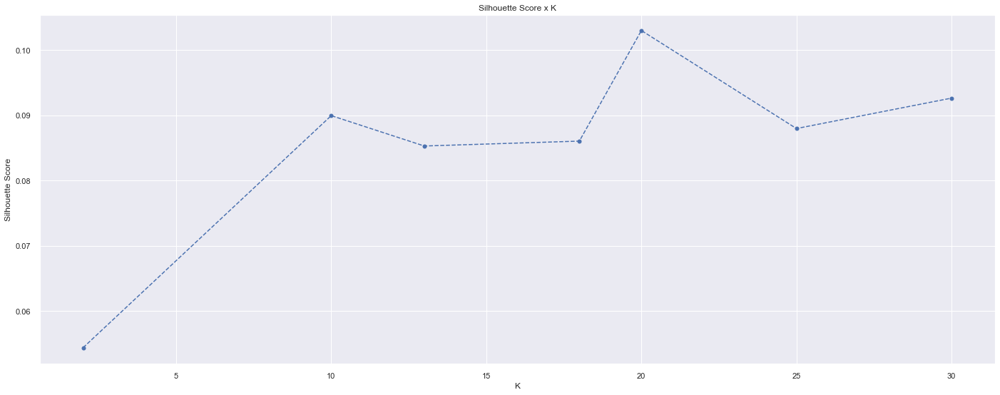

In [60]:
plt.plot( clusters, kmeans_list, linestyle='--', marker='o', color='b' )
plt.xlabel( 'K' );
plt.ylabel( 'Silhouette Score' );
plt.title( 'Silhouette Score x K' );

###### GMM

In [339]:
gmm_list = []
for k in clusters:
    # model definition
    gmm_model = mx.GaussianMixture( n_components=k )

    # model training
    gmm_model.fit( X )

    # model predict
    labels = gmm_model.predict( X )

    # model performance
    sil = m.silhouette_score( X, labels, metric='euclidean' )
    gmm_list.append( sil )
    print('Cicle:', k)

Ciclo: 2
Ciclo: 3
Ciclo: 4
Ciclo: 5
Ciclo: 6
Ciclo: 7


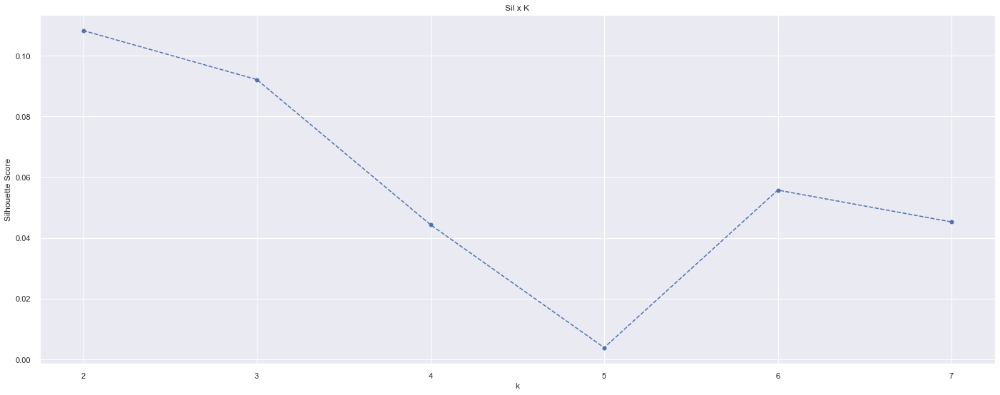

In [340]:
plt.plot( clusters, gmm_list, linestyle='--', marker='o', color='b' )
plt.xlabel( 'k');
plt.ylabel( 'Silhouette Score');
plt.title( 'Sil x K');

##### Hierarchical Clustering

In [43]:
from scipy.cluster import hierarchy as hc

In [44]:
# model definition and training
hc_model = hc.linkage( X, 'ward' )

[]

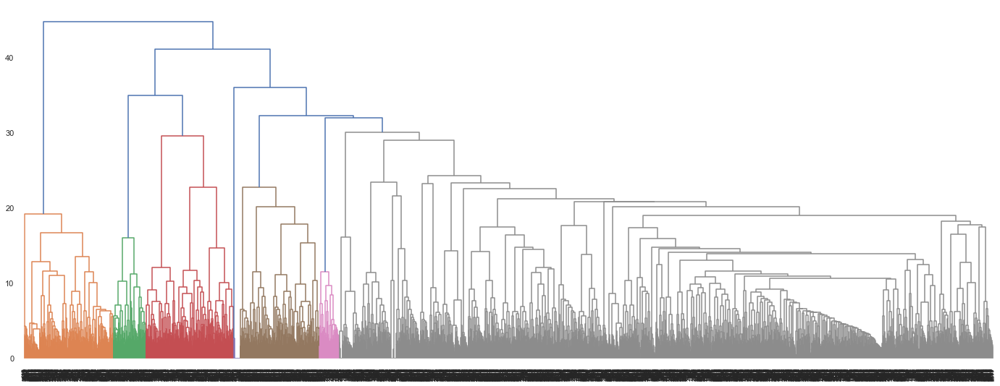

In [45]:
hc.dendrogram( 
    hc_model, 
    leaf_rotation=90,
    leaf_font_size=8
)

plt.plot()

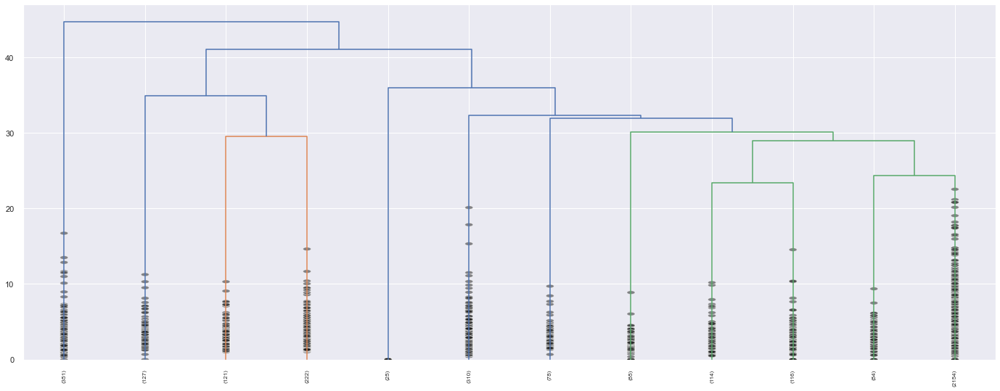

In [46]:
hc.dendrogram( 
    hc_model,
    truncate_mode='lastp',
    p=12,
    leaf_rotation=90,
    leaf_font_size=8,
    show_contracted=True
)

plt.show()

##### HClustering Silhouette Score

In [47]:
from sklearn import metrics as m

In [61]:
hc_list = []
for k in clusters:
    # model definition & training
    hc_model = hc.linkage( X, 'ward' )

    # model predict
    labels = hc.fcluster( hc_model, k, criterion='maxclust' )

    # metrics
    sil = m.silhouette_score( X, labels, metric='euclidean' )
    hc_list.append( sil )

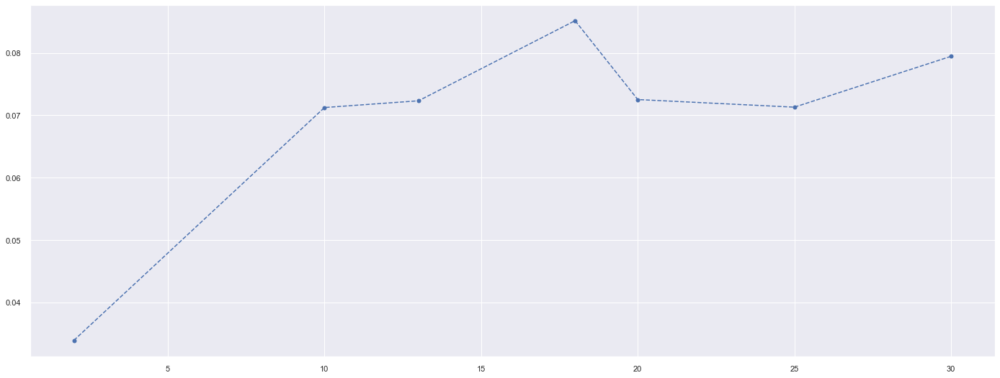

In [62]:
plt.plot( clusters,  hc_list, linestyle='--', marker='o', color='b' )

##### FINAL MODEL K-Means

In [63]:
# model definition
k = 20
kmeans = c.KMeans(init='random', n_clusters=k, n_init=10, max_iter=300, random_state=42) #max_iter iterações para achar o centróide

# model training
kmeans.fit(X)

#clustering
labels = kmeans.labels_

##### Cluster Validation

In [64]:
## WSS (within-cluster sum of square)
print('WSS Values: {}'.format(kmeans.inertia_))

## SS (Silhouette Score)
print('SS Values: {}'.format(m.silhouette_score(X, labels, metric='euclidean')))

WSS Values: 23967.834705363377
SS Values: 0.08007713309147417


##### Cluster Analysis 

In [65]:
df_text_cluster = df_text_cosine_tdif.copy()
df_text_cluster['cluster'] = labels
df_text_cluster.head()

doc_1  doc_2  doc_3  doc_4  doc_5  doc_6  doc_7  doc_8  doc_9  doc_10  doc_11  doc_12  doc_13  doc_14  doc_15  doc_16  doc_17  doc_18  doc_19  doc_20  doc_21  doc_22  doc_23  doc_24  doc_25  doc_26  doc_27  doc_28  doc_29  doc_30  doc_31  doc_32  doc_33  doc_34  doc_35  doc_36  doc_37  doc_38  doc_39  doc_40  doc_41  doc_42  doc_43  doc_44  doc_45  doc_46  doc_47  doc_48  doc_49  doc_50  doc_51  doc_52  doc_53  doc_54  doc_55  doc_56  doc_57  doc_58  doc_59  doc_60  doc_61  doc_62  doc_63  doc_64  doc_65  doc_66  doc_67  doc_68  doc_69  doc_70  doc_71  doc_72  doc_73  doc_74  doc_75  doc_76  doc_77  doc_78  doc_79  doc_80  doc_81  doc_82  doc_83  doc_84  doc_85  doc_86  doc_87  doc_88  doc_89  doc_90  doc_91  doc_92  doc_93  doc_94  doc_95  doc_96  doc_97  doc_98  doc_99  doc_100  doc_101  doc_102  doc_103  doc_104  doc_105  doc_106  doc_107  doc_108  doc_109  doc_110  doc_111  doc_112  doc_113  doc_114  doc_115  doc_116  doc_117  doc_118  doc_119  doc_120  doc_121  doc_122  doc_123  doc_124  doc_125  doc_126  doc_127  doc_128  doc_129  doc_130  doc_131  doc_132  doc_133  doc_134  doc_135  doc_136  doc_137  doc_138  doc_139  doc_140  doc_141  doc_142  doc_143  doc_144  doc_145  doc_146  doc_147  doc_148  doc_149  doc_150  doc_151  doc_152  doc_153  doc_154  doc_155  doc_156  doc_157  doc_158  doc_159  doc_160  doc_161  doc_162  doc_163  doc_164  doc_165  doc_166  doc_167  doc_168  doc_169  doc_170  doc_171  doc_172  doc_173  doc_174  doc_175  doc_176  doc_177  doc_178  doc_179  doc_180  doc_181  doc_182  doc_183  doc_184  doc_185  doc_186  doc_187  doc_188  doc_189  doc_190  doc_191  doc_192  doc_193  doc_194  doc_195  doc_196  doc_197  doc_198  doc_199  doc_200  doc_201  doc_202  doc_203  doc_204  doc_205  doc_206  doc_207  doc_208  doc_209  doc_210  doc_211  doc_212  doc_213  doc_214  doc_215  doc_216  doc_217  doc_218  doc_219  doc_220  doc_221  doc_222  doc_223  doc_224  doc_225  doc_226  doc_227  doc_228  doc_229  doc_230  doc_231  doc_232  doc_233  doc_234  doc_235  doc_236  doc_237  doc_238  doc_239  doc_240  doc_241  doc_242  doc_243  doc_244  doc_245  doc_246  doc_247  doc_248  doc_249  doc_250  doc_251  doc_252  doc_253  doc_254  doc_255  doc_256  doc_257  doc_258  doc_259  doc_260  doc_261  doc_262  doc_263  doc_264  doc_265  doc_266  doc_267  doc_268  doc_269  doc_270  doc_271  doc_272  doc_273  doc_274  doc_275  doc_276  doc_277  doc_278  doc_279  doc_280  doc_281  doc_282  doc_283  doc_284  doc_285  doc_286  doc_287  doc_288  doc_289  doc_290  doc_291  doc_292  doc_293  doc_294  doc_295  doc_296  doc_297  doc_298  doc_299  doc_300  doc_301  doc_302  doc_303  doc_304  doc_305  doc_306  doc_307  doc_308  doc_309  doc_310  doc_311  doc_312  doc_313  doc_314  doc_315  doc_316  doc_317  doc_318  doc_319  doc_320  doc_321  doc_322  doc_323  doc_324  doc_325  doc_326  doc_327  doc_328  doc_329  doc_330  doc_331  doc_332  doc_333  doc_334  doc_335  doc_336  doc_337  doc_338  doc_339  doc_340  doc_341  doc_342  doc_343  doc_344  doc_345  doc_346  doc_347  doc_348  doc_349  doc_350  doc_351  doc_352  doc_353  doc_354  doc_355  doc_356  doc_357  doc_358  doc_359  doc_360  doc_361  doc_362  doc_363  doc_364  doc_365  doc_366  doc_367  doc_368  doc_369  doc_370  doc_371  doc_372  doc_373  doc_374  doc_375  doc_376  doc_377  doc_378  doc_379  doc_380  doc_381  doc_382  doc_383  doc_384  doc_385  doc_386  doc_387  doc_388  doc_389  doc_390  doc_391  doc_392  doc_393  doc_394  doc_395  doc_396  doc_397  doc_398  doc_399  doc_400  doc_401  doc_402  doc_403  doc_404  doc_405  doc_406  doc_407  doc_408  doc_409  doc_410  doc_411  doc_412  doc_413  doc_414  doc_415  doc_416  doc_417  doc_418  doc_419  doc_420  doc_421  doc_422  doc_423  doc_424  doc_425  doc_426  doc_427  doc_428  doc_429  doc_430  doc_431  doc_432  doc_433  doc_434  doc_435  doc_436  doc_437  doc_438  doc_439  doc_440  doc_441  doc_442  doc_443  doc_444  doc_445  doc_446  doc_447  doc_448  doc_449  doc_450  doc_451  doc_452  doc_453  doc_454  doc_455  doc_456  doc_

In [38]:
pesq='doc_4'
df_text_cluster[(df_text_cluster[pesq] > 0) & (df_text_cluster['cluster'] == 7)].sort_values(pesq, ascending=False)

NameError: name 'df_text_cluster' is not defined

#### THIRD APPROACH

In [37]:
df4['description'] = df4['description'].apply(lambda x: x.lower())

In [38]:
text = df4['description'].unique().tolist()

###### TDIF VECTORIZER

In [39]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(stop_words={'english'}, lowercase=True, ngram_range=(1,8))
X = vectorizer.fit_transform(text)

In [326]:
print(vectorizer.get_feature_names())
print(X.shape)

['00', '10', '10 balloons', '10 blue', '10 blue polkadot', '10 blue polkadot party', '10 blue polkadot party candles', '10 card', '10 card christmas', '10 card christmas stamps', '10 card christmas stamps 16963', '10 card christmas welcome', '10 card christmas welcome 17112', '10 card kraft', '10 card kraft reindeer', '10 card kraft reindeer 17084', '10 card perfect', '10 card perfect nativity', '10 card perfect nativity 17089', '10 card snowman', '10 card snowman 16965', '10 cards', '10 cards 12', '10 cards 12 days', '10 cards 12 days of', '10 cards 12 days of xmas', '10 cards 12 days of xmas 17059', '10 cards 12 days wrap', '10 cards 12 days wrap 17058', '10 cards cheerful', '10 cards cheerful robin', '10 cards cheerful robin 17065', '10 cards christmas', '10 cards christmas bauble', '10 cards christmas bauble 16954', '10 cards christmas holly', '10 cards christmas holly 17259', '10 cards christmas robin', '10 cards christmas robin 17095', '10 cards christmas tree', '10 cards christm

###### KMEANS - CLUSTERING

In [40]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

In [41]:
X.shape

(3787, 22864)

In [349]:
kmeans_list = []
Sum_of_squared_distances = []
#K = range(1185,1220)
K = range(960,970)
#K = [960, 965, 970, 975, 980, 985, 990, 995, 1000]
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(X)
    
    labels = km.predict( X )
    Sum_of_squared_distances.append(km.inertia_)
    
    sil = m.silhouette_score( X, labels, metric='euclidean' )
    kmeans_list.append( sil )
    print('Cluster:', k)

Cluster: 960
Cluster: 961
Cluster: 962
Cluster: 963
Cluster: 964
Cluster: 965
Cluster: 966
Cluster: 967
Cluster: 968
Cluster: 969


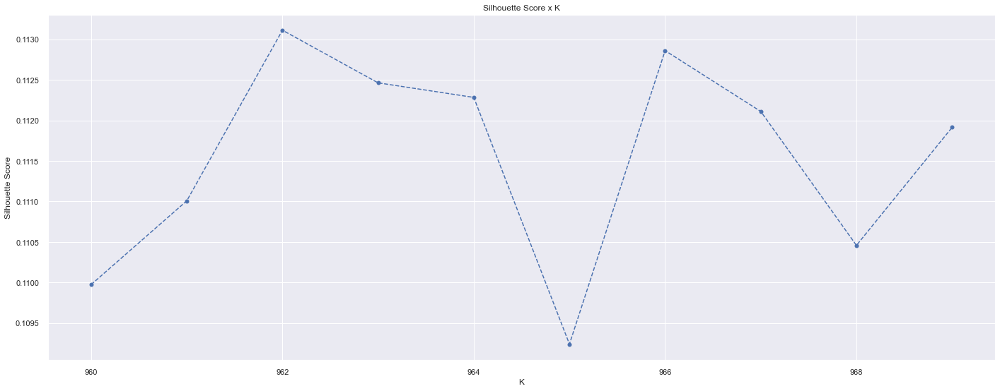

In [350]:
plt.plot( K, kmeans_list, linestyle='--', marker='o', color='b' )
plt.xlabel( 'K' );
plt.ylabel( 'Silhouette Score' );
plt.title( 'Silhouette Score x K' );

In [351]:
sorted(list(zip(K, kmeans_list)), key = lambda x: (x[1]))

[(965, 0.10923971473018075),
 (960, 0.10997395149633647),
 (968, 0.11045821365049154),
 (961, 0.1110078749234751),
 (969, 0.11191428529318295),
 (967, 0.11211079778021076),
 (964, 0.11228420639213794),
 (963, 0.11246393716639375),
 (966, 0.11286161973236332),
 (962, 0.11311345064459193)]

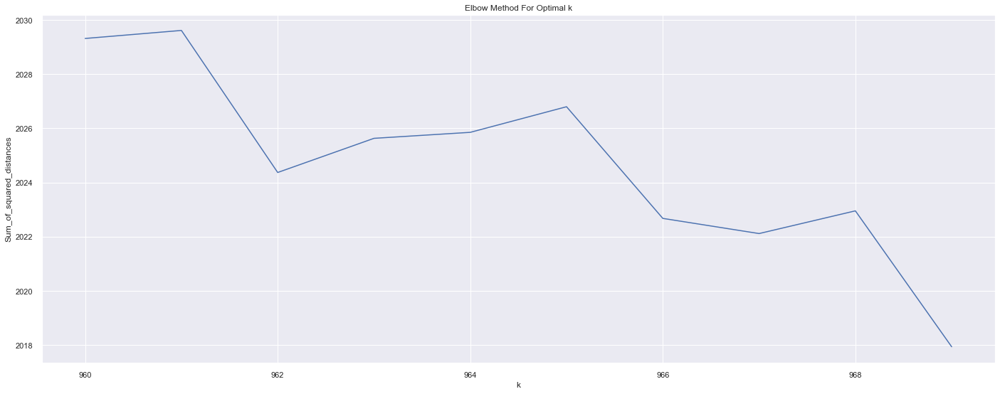

In [352]:
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [42]:
#(1187, 0.12268186818235662)
true_k = 962
model = KMeans(n_clusters=true_k)
model.fit(X)
labels=model.labels_

###### CLUSTER - DESCRIPTION

In [43]:
text_cl=pd.DataFrame(list(zip(text,labels)),columns=['description','cluster'])
#print(text_cl.sort_values(by=['cluster']))

In [44]:
len(text_cl['cluster'].unique())

962

In [45]:
text_cl.head()

,description,cluster
0,white hanging heart t-light holder,121
1,white metal lantern,953
2,cream cupid hearts coat hanger,564
3,knitted union flag hot water bottle,46
4,red woolly hottie white heart.,659


In [46]:
a = text_cl[['cluster','description']].groupby('cluster').count().sort_values('description', ascending=False).reset_index()
a#.groupby('title').count()

,cluster,description
0,60,34
1,10,25
2,510,23
3,438,23
4,468,22
5,12,19
6,46,19
7,769,19
8,107,19
9,121,18


In [47]:
text_cl[text_cl['cluster']==60]

,description,cluster
81,"airline lounge,metal sign",60
89,you're confusing me metal sign,60
90,cook with wine metal sign,60
91,gin + tonic diet metal sign,60
237,ladies & gentlemen metal sign,60
240,bathroom metal sign,60
241,kitchen metal sign,60
242,toilet metal sign,60
243,metal sign take it or leave it,60
244,i'm on holiday metal sign,60


In [53]:
text_cl.sort_values('cluster', ascending=False).head()

,description,cluster
3576,set 6 cards sparkly reindeer 17262,961
3702,mini lights woodland mushrooms,960
130,cream heart card holder,959
202,black heart card holder,959
661,string of stars card holder,959


In [71]:
# creating columns for each cluster created
text_cl_n = text_cl.copy()
for i in range(len(text_cl['cluster'].unique())):
    class_ = "class_" + str(i)
    text_cl_n[class_] = text_cl_n.apply(lambda x: 1 if x['cluster'] == i else 0, axis=1)

In [84]:
# merging the to df4 and insertint the unit_price on it
aux = df4[['description', 'unit_price']]
aux = aux.drop_duplicates(subset='description')
text_cl_t = pd.merge(text_cl_n, aux, on='description', how='left')
for i in range(len(text_cl['cluster'].unique())):
    class_ = "class_" + str(i)
    text_cl_t[class_] = text_cl_t.apply(lambda x: x['unit_price'] if x[class_] == 1 else 0, axis=1)
text_cl_t = text_cl_t.drop(['cluster', 'unit_price'], axis=1)
df4_ = pd.merge(df4, text_cl_t, on='description', how='left')

# calculation the gross revenue for each class
for i in range(len(text_cl['cluster'].unique())):
    class_ = "class_" + str(i)
    df4_[class_] = df4_[class_] * df4_['quantity']

,description,cluster,class_0,class_1,class_2,class_3,class_4,class_5,class_6,class_7,class_8,class_9,class_10,class_11,class_12,class_13,class_14,class_15,class_16,class_17,class_18,class_19,class_20,class_21,class_22,class_23,class_24,class_25,class_26,class_27,class_28,class_29,class_30,class_31,class_32,class_33,class_34,class_35,class_36,class_37,class_38,class_39,class_40,class_41,class_42,class_43,class_44,class_45,class_46,class_47,class_48,class_49,class_50,class_51,class_52,class_53,class_54,class_55,class_56,class_57,class_58,class_59,class_60,class_61,class_62,class_63,class_64,class_65,class_66,class_67,class_68,class_69,class_70,class_71,class_72,class_73,class_74,class_75,class_76,class_77,class_78,class_79,class_80,class_81,class_82,class_83,class_84,class_85,class_86,class_87,class_88,class_89,class_90,class_91,class_92,class_93,class_94,class_95,class_96,class_97,class_98,class_99,class_100,class_101,class_102,class_103,class_104,class_105,class_106,class_107,class_108,class_109,class_110,class_111,class_112,class_113,class_114,class_115,class_116,class_117,class_118,class_119,class_120,class_121,class_122,class_123,class_124,class_125,class_126,class_127,class_128,class_129,class_130,class_131,class_132,class_133,class_134,class_135,class_136,class_137,class_138,class_139,class_140,class_141,class_142,class_143,class_144,class_145,class_146,class_147,class_148,class_149,class_150,class_151,class_152,class_153,class_154,class_155,class_156,class_157,class_158,class_159,class_160,class_161,class_162,class_163,class_164,class_165,class_166,class_167,class_168,class_169,class_170,class_171,class_172,class_173,class_174,class_175,class_176,class_177,class_178,class_179,class_180,class_181,class_182,class_183,class_184,class_185,class_186,class_187,class_188,class_189,class_190,class_191,class_192,class_193,class_194,class_195,class_196,class_197,class_198,class_199,class_200,class_201,class_202,class_203,class_204,class_205,class_206,class_207,class_208,class_209,class_210,class_211,class_212,class_213,class_214,class_215,class_216,class_217,class_218,class_219,class_220,class_221,class_222,class_223,class_224,class_225,class_226,class_227,class_228,class_229,class_230,class_231,class_232,class_233,class_234,class_235,class_236,class_237,class_238,class_239,class_240,class_241,class_242,class_243,class_244,class_245,class_246,class_247,class_248,class_249,class_250,class_251,class_252,class_253,class_254,class_255,class_256,class_257,class_258,class_259,class_260,class_261,class_262,class_263,class_264,class_265,class_266,class_267,class_268,class_269,class_270,class_271,class_272,class_273,class_274,class_275,class_276,class_277,class_278,class_279,class_280,class_281,class_282,class_283,class_284,class_285,class_286,class_287,class_288,class_289,class_290,class_291,class_292,class_293,class_294,class_295,class_296,class_297,class_298,class_299,class_300,class_301,class_302,class_303,class_304,class_305,class_306,class_307,class_308,class_309,class_310,class_311,class_312,class_313,class_314,class_315,class_316,class_317,class_318,class_319,class_320,class_321,class_322,class_323,class_324,class_325,class_326,class_327,class_328,class_329,class_330,class_331,class_332,class_333,class_334,class_335,class_336,class_337,class_338,class_339,class_340,class_341,class_342,class_343,class_344,class_345,class_346,class_347,class_348,class_349,class_350,class_351,class_352,class_353,class_354,class_355,class_356,class_357,class_358,class_359,class_360,class_361,class_362,class_363,class_364,class_365,class_366,class_367,class_368,class_369,class_370,class_371,class_372,class_373,class_374,class_375,class_376,class_377,class_378,class_379,class_380,class_381,class_382,class_383,class_384,class_385,class_386,class_387,class_388,class_389,class_390,class_391,class_392,class_393,class_394,class_395,class_396,class_397,class_398,class_399,class_400,class_401,class_402,class_403,class_404,class_405,class_406,class_407,class_408

In [89]:
df4_[df4_['class_0'] > 0].head()

,invoice_no,stock_code,quantity,invoice_date,unit_price,country,description,customer_id,gross_revenue,total_returned,manual_p,class_0,class_1,class_2,class_3,class_4,class_5,class_6,class_7,class_8,class_9,class_10,class_11,class_12,class_13,class_14,class_15,class_16,class_17,class_18,class_19,class_20,class_21,class_22,class_23,class_24,class_25,class_26,class_27,class_28,class_29,class_30,class_31,class_32,class_33,class_34,class_35,class_36,class_37,class_38,class_39,class_40,class_41,class_42,class_43,class_44,class_45,class_46,class_47,class_48,class_49,class_50,class_51,class_52,class_53,class_54,class_55,class_56,class_57,class_58,class_59,class_60,class_61,class_62,class_63,class_64,class_65,class_66,class_67,class_68,class_69,class_70,class_71,class_72,class_73,class_74,class_75,class_76,class_77,class_78,class_79,class_80,class_81,class_82,class_83,class_84,class_85,class_86,class_87,class_88,class_89,class_90,class_91,class_92,class_93,class_94,class_95,class_96,class_97,class_98,class_99,class_100,class_101,class_102,class_103,class_104,class_105,class_106,class_107,class_108,class_109,class_110,class_111,class_112,class_113,class_114,class_115,class_116,class_117,class_118,class_119,class_120,class_121,class_122,class_123,class_124,class_125,class_126,class_127,class_128,class_129,class_130,class_131,class_132,class_133,class_134,class_135,class_136,class_137,class_138,class_139,class_140,class_141,class_142,class_143,class_144,class_145,class_146,class_147,class_148,class_149,class_150,class_151,class_152,class_153,class_154,class_155,class_156,class_157,class_158,class_159,class_160,class_161,class_162,class_163,class_164,class_165,class_166,class_167,class_168,class_169,class_170,class_171,class_172,class_173,class_174,class_175,class_176,class_177,class_178,class_179,class_180,class_181,class_182,class_183,class_184,class_185,class_186,class_187,class_188,class_189,class_190,class_191,class_192,class_193,class_194,class_195,class_196,class_197,class_198,class_199,class_200,class_201,class_202,class_203,class_204,class_205,class_206,class_207,class_208,class_209,class_210,class_211,class_212,class_213,class_214,class_215,class_216,class_217,class_218,class_219,class_220,class_221,class_222,class_223,class_224,class_225,class_226,class_227,class_228,class_229,class_230,class_231,class_232,class_233,class_234,class_235,class_236,class_237,class_238,class_239,class_240,class_241,class_242,class_243,class_244,class_245,class_246,class_247,class_248,class_249,class_250,class_251,class_252,class_253,class_254,class_255,class_256,class_257,class_258,class_259,class_260,class_261,class_262,class_263,class_264,class_265,class_266,class_267,class_268,class_269,class_270,class_271,class_272,class_273,class_274,class_275,class_276,class_277,class_278,class_279,class_280,class_281,class_282,class_283,class_284,class_285,class_286,class_287,class_288,class_289,class_290,class_291,class_292,class_293,class_294,class_295,class_296,class_297,class_298,class_299,class_300,class_301,class_302,class_303,class_304,class_305,class_306,class_307,class_308,class_309,class_310,class_311,class_312,class_313,class_314,class_315,class_316,class_317,class_318,class_319,class_320,class_321,class_322,class_323,class_324,class_325,class_326,class_327,class_328,class_329,class_330,class_331,class_332,class_333,class_334,class_335,class_336,class_337,class_338,class_339,class_340,class_341,class_342,class_343,class_344,class_345,class_346,class_347,class_348,class_349,class_350,class_351,class_352,class_353,class_354,class_355,class_356,class_357,class_358,class_359,class_360,class_361,class_362,class_363,class_364,class_365,class_366,class_367,class_368,class_369,class_370,class_371,class_372,class_373,class_374,class_375,class_376,class_377,class_378,class_379,class_380,class_381,class_382,class_383,class_384,class_385,class_386,class_387,class_388,class_389,class_390,class_391,class_392,class_393,class_394,class_395,class_396,class_397,clas

In [91]:
df4 = df4_.copy()

#### FOURTH APPROACH - CANCELLED

In [242]:
import spacy

nlp = spacy.load('en_core_web_lg')

In [317]:
text = "doormat new england"
def subtree_matcher(sent):
    doc = nlp(sent)
    extraction = []

    for i, tok in enumerate(doc):
        print(tok.dep_, i)
        if tok.dep_.endswith("subj") == True:
            extraction.append(tok.text)
        if tok.dep_.endswith("obj") == True:
            extraction.append(tok.text)
        if tok.dep_ in ["npadvmod"]:
            extraction.append(tok.text)
        if tok.dep_ in ["ROOT"]:
            extraction.append(tok.text)
    return extraction
subtree_matcher(text)

compound 0
compound 1
ROOT 2


['england']

In [319]:
dir(tok)

['_',
 '__bytes__',
 '__class__',
 '__delattr__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__len__',
 '__lt__',
 '__ne__',
 '__new__',
 '__pyx_vtable__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__unicode__',
 'ancestors',
 'check_flag',
 'children',
 'cluster',
 'conjuncts',
 'dep',
 'dep_',
 'doc',
 'ent_id',
 'ent_id_',
 'ent_iob',
 'ent_iob_',
 'ent_kb_id',
 'ent_kb_id_',
 'ent_type',
 'ent_type_',
 'get_extension',
 'has_dep',
 'has_extension',
 'has_head',
 'has_morph',
 'has_vector',
 'head',
 'i',
 'idx',
 'iob_strings',
 'is_alpha',
 'is_ancestor',
 'is_ascii',
 'is_bracket',
 'is_currency',
 'is_digit',
 'is_left_punct',
 'is_lower',
 'is_oov',
 'is_punct',
 'is_quote',
 'is_right_punct',
 'is_sent_end',
 'is_sent_start',
 'is_space',
 'is_stop',
 'is_title',
 'is_upper',
 'lang',
 'lang_',
 'le

In [320]:
tok

london

In [318]:
from spacy import displacy
doc = nlp(text)
options = {'compact': False, 'distance': 50, 'arrow_spacing': 5}
svg = displacy.render(doc, style='dep', options=options)

In [290]:
aux_ = df4[['stock_code', 'description']].drop_duplicates(subset='description').copy()
aux_['root'] = aux_['description'].apply(lambda x: subtree_matcher(x))

In [360]:
aux_.sample(50)

,stock_code,description,root
163374,23133,large ivory heart wall organiser,[organiser]
222821,23291,dolly girl childrens cup,[cup]
3154,21172,party metal sign,[sign]
170980,23149,antique ivory wire bowl small,[bowl]
75128,84919,blue cushion cover with flower,"[cover, flower]"
21068,90093,clear crystal star phone charm,[charm]
774,21259,victorian sewing box small,[box]
3906,22893,mini cake stand t-light holder,"[cake, stand, t, holder]"
10665,84789,enchanted bird plant cage,[cage]
238031,23025,drawer knob vintage glass ball,"[drawer, ball]"


#### CANCELLED APPROACH

In [96]:
#df4['description'] = df4['description'].apply(lambda x: x.lower())

In [167]:
#df4.head(1)

In [168]:
#aux = df4[['stock_code', 'description', 'unit_price']].copy()
#aux.head()
##text = df4['description'].unique().tolist()

In [169]:
#aux['stock_code_num'] = aux['stock_code'].apply(lambda x: re.search('\d+|\D+', x).group(0))

In [170]:
#aux2 = aux[['stock_code', 'description', 'stock_code_num']]
#aux_desc = aux2.drop_duplicates(subset='description')
#print(aux_desc.shape)

### 4.2.4 Invoice Date

In [92]:
#taking min / max buying date by customer
date_min = df4[['customer_id', 'invoice_date']].groupby('customer_id').min().reset_index().rename(columns={'invoice_date': 'first_buy_date'})
date_max = df4[['customer_id', 'invoice_date']].groupby('customer_id').max().reset_index().rename(columns={'invoice_date': 'last_buy_date'})

#total buy adjusted - removing returned and manual values from the gross amount
aux2 = df4[['customer_id', 'gross_revenue', 'total_returned', 'manual_p']].copy()
aux2['gross_revenue_adj'] = aux2['gross_revenue'] + aux2['total_returned'] + aux2['manual_p']
total_buy_adj = aux2[['customer_id', 'gross_revenue_adj']].groupby('customer_id').sum().reset_index().rename(columns={'gross_revenue_adj': 'total_gross_revenue_adj'})

# buy frequency by customer
aux = df4[['customer_id', 'invoice_no']].drop_duplicates(subset='invoice_no')
buy_frequency = aux.groupby('customer_id').count().reset_index().rename(columns={'invoice_no': 'total_invoices'})

#joing the tables
df_date = pd.merge(date_min, date_max, on='customer_id', how='left')
df_date = pd.merge(df_date, buy_frequency, on='customer_id', how='left')
df_date = pd.merge(df_date, total_buy_adj, on='customer_id', how='left')

df_date['date_interval'] = df_date['last_buy_date'] - df_date['first_buy_date']
df_date['date_interval'] = df_date['date_interval'].apply(lambda x: x.days)
df_date['date_interval'] = df_date['date_interval'].apply(lambda x: 0 if x==0 else x)
df_date['buy_rate'] = df_date['date_interval'] / df_date['total_invoices']
df_date['customer_by_day'] = df_date['total_gross_revenue_adj'] / df_date['date_interval']
df_date.replace([np.inf, -np.inf], 0, inplace=True)
df_date = df_date.drop(columns=['first_buy_date', 'last_buy_date'])

In [93]:
df_date.sort_values('customer_by_day', ascending=False).head(30)

,customer_id,total_invoices,total_gross_revenue_adj,date_interval,buy_rate,customer_by_day
4259,18139,8,8393.22,1,0.12,8393.22
3428,16986,2,1873.20,1,0.50,1873.20
3798,17509,11,6100.74,6,0.55,1016.79
1702,14646,74,278466.02,353,4.77,788.86
4255,18133,2,715.50,1,0.50,715.50
4232,18102,62,256438.49,367,5.92,698.74
2483,15700,3,664.03,1,0.33,664.03
1880,14893,2,1237.85,2,1.00,618.93
2207,15332,4,1661.06,3,0.75,553.69
1299,14096,18,53147.98,97,5.39,547.92


### 4.3. Final Dataset

In [94]:
#All the products bellow do not have enough representative 
to_remove_code = ['M','m','23113','23114','23117','23115','23116','84968E','21275','20818','90159','84805B','35598C']

In [95]:
# dropping records do not have total of sum > 0
df4_=df4[~df4['stock_code'].isin(to_remove_code)]
df4_.shape

(536094, 973)

In [228]:
## inserting values to the new created columns
#for i in range(df4_.iloc[:, 12:813].shape[1]):
#    df4_.iloc[:, i+12] = df4_['unit_price_adj']*df4_['quantity']*df4_.iloc[:, i+12]

In [96]:
df4 = df4_.copy()

# <font color='red'> 5.0. Data Preparation </font>

In [116]:
df5 = df4.copy()
df5.head()

,invoice_no,stock_code,quantity,invoice_date,unit_price,country,description,customer_id,gross_revenue,total_returned,manual_p,class_0,class_1,class_2,class_3,class_4,class_5,class_6,class_7,class_8,class_9,class_10,class_11,class_12,class_13,class_14,class_15,class_16,class_17,class_18,class_19,class_20,class_21,class_22,class_23,class_24,class_25,class_26,class_27,class_28,class_29,class_30,class_31,class_32,class_33,class_34,class_35,class_36,class_37,class_38,class_39,class_40,class_41,class_42,class_43,class_44,class_45,class_46,class_47,class_48,class_49,class_50,class_51,class_52,class_53,class_54,class_55,class_56,class_57,class_58,class_59,class_60,class_61,class_62,class_63,class_64,class_65,class_66,class_67,class_68,class_69,class_70,class_71,class_72,class_73,class_74,class_75,class_76,class_77,class_78,class_79,class_80,class_81,class_82,class_83,class_84,class_85,class_86,class_87,class_88,class_89,class_90,class_91,class_92,class_93,class_94,class_95,class_96,class_97,class_98,class_99,class_100,class_101,class_102,class_103,class_104,class_105,class_106,class_107,class_108,class_109,class_110,class_111,class_112,class_113,class_114,class_115,class_116,class_117,class_118,class_119,class_120,class_121,class_122,class_123,class_124,class_125,class_126,class_127,class_128,class_129,class_130,class_131,class_132,class_133,class_134,class_135,class_136,class_137,class_138,class_139,class_140,class_141,class_142,class_143,class_144,class_145,class_146,class_147,class_148,class_149,class_150,class_151,class_152,class_153,class_154,class_155,class_156,class_157,class_158,class_159,class_160,class_161,class_162,class_163,class_164,class_165,class_166,class_167,class_168,class_169,class_170,class_171,class_172,class_173,class_174,class_175,class_176,class_177,class_178,class_179,class_180,class_181,class_182,class_183,class_184,class_185,class_186,class_187,class_188,class_189,class_190,class_191,class_192,class_193,class_194,class_195,class_196,class_197,class_198,class_199,class_200,class_201,class_202,class_203,class_204,class_205,class_206,class_207,class_208,class_209,class_210,class_211,class_212,class_213,class_214,class_215,class_216,class_217,class_218,class_219,class_220,class_221,class_222,class_223,class_224,class_225,class_226,class_227,class_228,class_229,class_230,class_231,class_232,class_233,class_234,class_235,class_236,class_237,class_238,class_239,class_240,class_241,class_242,class_243,class_244,class_245,class_246,class_247,class_248,class_249,class_250,class_251,class_252,class_253,class_254,class_255,class_256,class_257,class_258,class_259,class_260,class_261,class_262,class_263,class_264,class_265,class_266,class_267,class_268,class_269,class_270,class_271,class_272,class_273,class_274,class_275,class_276,class_277,class_278,class_279,class_280,class_281,class_282,class_283,class_284,class_285,class_286,class_287,class_288,class_289,class_290,class_291,class_292,class_293,class_294,class_295,class_296,class_297,class_298,class_299,class_300,class_301,class_302,class_303,class_304,class_305,class_306,class_307,class_308,class_309,class_310,class_311,class_312,class_313,class_314,class_315,class_316,class_317,class_318,class_319,class_320,class_321,class_322,class_323,class_324,class_325,class_326,class_327,class_328,class_329,class_330,class_331,class_332,class_333,class_334,class_335,class_336,class_337,class_338,class_339,class_340,class_341,class_342,class_343,class_344,class_345,class_346,class_347,class_348,class_349,class_350,class_351,class_352,class_353,class_354,class_355,class_356,class_357,class_358,class_359,class_360,class_361,class_362,class_363,class_364,class_365,class_366,class_367,class_368,class_369,class_370,class_371,class_372,class_373,class_374,class_375,class_376,class_377,class_378,class_379,class_380,class_381,class_382,class_383,class_384,class_385,class_386,class_387,class_388,class_389,class_390,class_391,class_392,class_393,class_394,class_395,class_396,class_397,clas

In [117]:
df5 = df5.drop(columns=['stock_code', 'description', 'country', 'gross_revenue'])

In [118]:
df5_ = df5.groupby(['customer_id', 'invoice_no']).sum().reset_index()
df5_ = pd.merge(df5_, df_postal, on='invoice_no', how='left' )
df5_['total_postal'] = df5_.apply(lambda x: x['total_postal'] if x['total_postal'] > 0 else 0, axis=1)

In [104]:
df5_.head()

,customer_id,invoice_no,quantity,unit_price,total_returned,manual_p,class_0,class_1,class_2,class_3,class_4,class_5,class_6,class_7,class_8,class_9,class_10,class_11,class_12,class_13,class_14,class_15,class_16,class_17,class_18,class_19,class_20,class_21,class_22,class_23,class_24,class_25,class_26,class_27,class_28,class_29,class_30,class_31,class_32,class_33,class_34,class_35,class_36,class_37,class_38,class_39,class_40,class_41,class_42,class_43,class_44,class_45,class_46,class_47,class_48,class_49,class_50,class_51,class_52,class_53,class_54,class_55,class_56,class_57,class_58,class_59,class_60,class_61,class_62,class_63,class_64,class_65,class_66,class_67,class_68,class_69,class_70,class_71,class_72,class_73,class_74,class_75,class_76,class_77,class_78,class_79,class_80,class_81,class_82,class_83,class_84,class_85,class_86,class_87,class_88,class_89,class_90,class_91,class_92,class_93,class_94,class_95,class_96,class_97,class_98,class_99,class_100,class_101,class_102,class_103,class_104,class_105,class_106,class_107,class_108,class_109,class_110,class_111,class_112,class_113,class_114,class_115,class_116,class_117,class_118,class_119,class_120,class_121,class_122,class_123,class_124,class_125,class_126,class_127,class_128,class_129,class_130,class_131,class_132,class_133,class_134,class_135,class_136,class_137,class_138,class_139,class_140,class_141,class_142,class_143,class_144,class_145,class_146,class_147,class_148,class_149,class_150,class_151,class_152,class_153,class_154,class_155,class_156,class_157,class_158,class_159,class_160,class_161,class_162,class_163,class_164,class_165,class_166,class_167,class_168,class_169,class_170,class_171,class_172,class_173,class_174,class_175,class_176,class_177,class_178,class_179,class_180,class_181,class_182,class_183,class_184,class_185,class_186,class_187,class_188,class_189,class_190,class_191,class_192,class_193,class_194,class_195,class_196,class_197,class_198,class_199,class_200,class_201,class_202,class_203,class_204,class_205,class_206,class_207,class_208,class_209,class_210,class_211,class_212,class_213,class_214,class_215,class_216,class_217,class_218,class_219,class_220,class_221,class_222,class_223,class_224,class_225,class_226,class_227,class_228,class_229,class_230,class_231,class_232,class_233,class_234,class_235,class_236,class_237,class_238,class_239,class_240,class_241,class_242,class_243,class_244,class_245,class_246,class_247,class_248,class_249,class_250,class_251,class_252,class_253,class_254,class_255,class_256,class_257,class_258,class_259,class_260,class_261,class_262,class_263,class_264,class_265,class_266,class_267,class_268,class_269,class_270,class_271,class_272,class_273,class_274,class_275,class_276,class_277,class_278,class_279,class_280,class_281,class_282,class_283,class_284,class_285,class_286,class_287,class_288,class_289,class_290,class_291,class_292,class_293,class_294,class_295,class_296,class_297,class_298,class_299,class_300,class_301,class_302,class_303,class_304,class_305,class_306,class_307,class_308,class_309,class_310,class_311,class_312,class_313,class_314,class_315,class_316,class_317,class_318,class_319,class_320,class_321,class_322,class_323,class_324,class_325,class_326,class_327,class_328,class_329,class_330,class_331,class_332,class_333,class_334,class_335,class_336,class_337,class_338,class_339,class_340,class_341,class_342,class_343,class_344,class_345,class_346,class_347,class_348,class_349,class_350,class_351,class_352,class_353,class_354,class_355,class_356,class_357,class_358,class_359,class_360,class_361,class_362,class_363,class_364,class_365,class_366,class_367,class_368,class_369,class_370,class_371,class_372,class_373,class_374,class_375,class_376,class_377,class_378,class_379,class_380,class_381,class_382,class_383,class_384,class_385,class_386,class_387,class_388,class_389,class_390,class_391,class_392,class_393,class_394,class_395,class_396,class_397,class_398,class_399,class_400,class_401,class_402,class_403,cl

In [105]:
df5_.isna().sum()

customer_id       0
invoice_no        0
quantity          0
unit_price        0
total_returned    0
manual_p          0
class_0           0
class_1           0
class_2           0
class_3           0
class_4           0
class_5           0
class_6           0
class_7           0
class_8           0
class_9           0
class_10          0
class_11          0
class_12          0
class_13          0
class_14          0
class_15          0
class_16          0
class_17          0
class_18          0
class_19          0
class_20          0
class_21          0
class_22          0
class_23          0
class_24          0
class_25          0
class_26          0
class_27          0
class_28          0
class_29          0
class_30          0
class_31          0
class_32          0
class_33          0
class_34          0
class_35          0
class_36          0
class_37          0
class_38          0
class_39          0
class_40          0
class_41          0
class_42          0
class_43          0


In [119]:
# cicle 3 = customers with 0 or negative gross revenue adjusted
customer_rm = [12346, 12503, 12505, 12558, 12605, 12607, 12666, 12870, 12943, 13154, 13364, 13672, 13693, 13829, 13958, 14119, 14213, 14437, 14557, 14627, 14679, 14777, 14792, 15369, 15590, 15638, 15728,
               15802, 15823, 16061, 16138, 16252, 16262, 16428, 16454, 16546, 16579, 16742, 16878, 16995, 17065, 17307, 17448, 17547, 17548, 17603, 17820, 18141, 18256, 18268, 18274]

df5_=df5_[~df5_['customer_id'].isin(customer_rm)]

In [120]:
df5 = df5_.groupby('customer_id').sum().reset_index()
df5 = pd.merge(df5, df_date, on='customer_id', how='left')

In [121]:
df5.sample(10)

customer_id  quantity  unit_price  total_returned  manual_p  class_0  class_1  class_2  class_3  class_4  class_5  class_6  class_7  class_8  class_9  class_10  class_11  class_12  class_13  class_14  class_15  class_16  class_17  class_18  class_19  class_20  class_21  class_22  class_23  class_24  class_25  class_26  class_27  class_28  class_29  class_30  class_31  class_32  class_33  class_34  class_35  class_36  class_37  class_38  class_39  class_40  class_41  class_42  class_43  class_44  class_45  class_46  class_47  class_48  class_49  class_50  class_51  class_52  class_53  class_54  class_55  class_56  class_57  class_58  class_59  class_60  class_61  class_62  class_63  class_64  class_65  class_66  class_67  class_68  class_69  class_70  class_71  class_72  class_73  class_74  class_75  class_76  class_77  class_78  class_79  class_80  class_81  class_82  class_83  class_84  class_85  class_86  class_87  class_88  class_89  class_90  class_91  class_92  class_93  class_94  class_95  class_96  class_97  class_98  class_99  class_100  class_101  class_102  class_103  class_104  class_105  class_106  class_107  class_108  class_109  class_110  class_111  class_112  class_113  class_114  class_115  class_116  class_117  class_118  class_119  class_120  class_121  class_122  class_123  class_124  class_125  class_126  class_127  class_128  class_129  class_130  class_131  class_132  class_133  class_134  class_135  class_136  class_137  class_138  class_139  class_140  class_141  class_142  class_143  class_144  class_145  class_146  class_147  class_148  class_149  class_150  class_151  class_152  class_153  class_154  class_155  class_156  class_157  class_158  class_159  class_160  class_161  class_162  class_163  class_164  class_165  class_166  class_167  class_168  class_169  class_170  class_171  class_172  class_173  class_174  class_175  class_176  class_177  class_178  class_179  class_180  class_181  class_182  class_183  class_184  class_185  class_186  class_187  class_188  class_189  class_190  class_191  class_192  class_193  class_194  class_195  class_196  class_197  class_198  class_199  class_200  class_201  class_202  class_203  class_204  class_205  class_206  class_207  class_208  class_209  class_210  class_211  class_212  class_213  class_214  class_215  class_216  class_217  class_218  class_219  class_220  class_221  class_222  class_223  class_224  class_225  class_226  class_227  class_228  class_229  class_230  class_231  class_232  class_233  class_234  class_235  class_236  class_237  class_238  class_239  class_240  class_241  class_242  class_243  class_244  class_245  class_246  class_247  class_248  class_249  class_250  class_251  class_252  class_253  class_254  class_255  class_256  class_257  class_258  class_259  class_260  class_261  class_262  class_263  class_264  class_265  class_266  class_267  class_268  class_269  class_270  class_271  class_272  class_273  class_274  class_275  class_276  class_277  class_278  class_279  class_280  class_281  class_282  class_283  class_284  class_285  class_286  class_287  class_288  class_289  class_290  class_291  class_292  class_293  class_294  class_295  class_296  class_297  class_298  class_299  class_300  class_301  class_302  class_303  class_304  class_305  class_306  class_307  class_308  class_309  class_310  class_311  class_312  class_313  class_314  class_315  class_316  class_317  class_318  class_319  class_320  class_321  class_322  class_323  class_324  class_325  class_326  class_327  class_328  class_329  class_330  class_331  class_332  class_333  class_334  class_335  class_336  class_337  class_338  class_339  class_340  class_341  class_342  class_343  class_344  class_345  class_346  class_347  class_348  class_349  class_350  class_351  class_352  class_353  class_354  class_355  class_356  class_357  class_358  class_359  class_360  class_361  class_362  class_363  class_364  class_365  class_366  class_367  c

In [122]:
# to use on cluster analyzis
df5_p = df5.copy()
df5 = df5.drop(columns=['customer_id', 'unit_price', 'manual_p', 'total_returned'])

In [123]:
df5.replace([np.inf, -np.inf], 0, inplace=True)

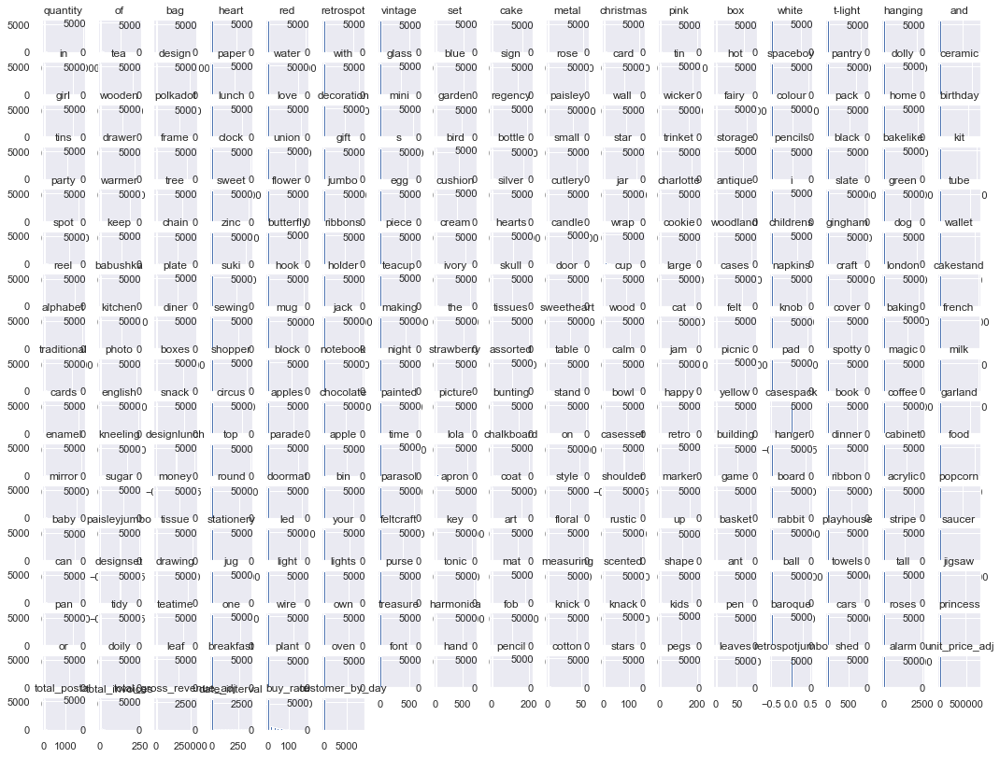

In [258]:
df5.hist(bins=30, figsize = (18,14));

In [142]:
#plt.figure( figsize=(25, 12) )
#sns.pairplot( df5 )

## 5.1. NORMALIZATION

In [ ]:
# No potencial normal distribution

## 5.2. RESCALLING

In [111]:
df5.columns

Index(['quantity', 'total_returned', 'class_0', 'class_1', 'class_2',
       'class_3', 'class_4', 'class_5', 'class_6', 'class_7',
       ...
       'class_958', 'class_959', 'class_960', 'class_961', 'total_postal',
       'total_invoices', 'total_gross_revenue_adj', 'date_interval',
       'buy_rate', 'customer_by_day'],
      dtype='object', length=970)

In [124]:
for i in range(df5.shape[1]):
    mm = pp.MinMaxScaler()
    df5.iloc[:, i] = mm.fit_transform(df5.iloc[:, i].values.reshape(-1, 1))

In [125]:
df5.head()

,quantity,class_0,class_1,class_2,class_3,class_4,class_5,class_6,class_7,class_8,class_9,class_10,class_11,class_12,class_13,class_14,class_15,class_16,class_17,class_18,class_19,class_20,class_21,class_22,class_23,class_24,class_25,class_26,class_27,class_28,class_29,class_30,class_31,class_32,class_33,class_34,class_35,class_36,class_37,class_38,class_39,class_40,class_41,class_42,class_43,class_44,class_45,class_46,class_47,class_48,class_49,class_50,class_51,class_52,class_53,class_54,class_55,class_56,class_57,class_58,class_59,class_60,class_61,class_62,class_63,class_64,class_65,class_66,class_67,class_68,class_69,class_70,class_71,class_72,class_73,class_74,class_75,class_76,class_77,class_78,class_79,class_80,class_81,class_82,class_83,class_84,class_85,class_86,class_87,class_88,class_89,class_90,class_91,class_92,class_93,class_94,class_95,class_96,class_97,class_98,class_99,class_100,class_101,class_102,class_103,class_104,class_105,class_106,class_107,class_108,class_109,class_110,class_111,class_112,class_113,class_114,class_115,class_116,class_117,class_118,class_119,class_120,class_121,class_122,class_123,class_124,class_125,class_126,class_127,class_128,class_129,class_130,class_131,class_132,class_133,class_134,class_135,class_136,class_137,class_138,class_139,class_140,class_141,class_142,class_143,class_144,class_145,class_146,class_147,class_148,class_149,class_150,class_151,class_152,class_153,class_154,class_155,class_156,class_157,class_158,class_159,class_160,class_161,class_162,class_163,class_164,class_165,class_166,class_167,class_168,class_169,class_170,class_171,class_172,class_173,class_174,class_175,class_176,class_177,class_178,class_179,class_180,class_181,class_182,class_183,class_184,class_185,class_186,class_187,class_188,class_189,class_190,class_191,class_192,class_193,class_194,class_195,class_196,class_197,class_198,class_199,class_200,class_201,class_202,class_203,class_204,class_205,class_206,class_207,class_208,class_209,class_210,class_211,class_212,class_213,class_214,class_215,class_216,class_217,class_218,class_219,class_220,class_221,class_222,class_223,class_224,class_225,class_226,class_227,class_228,class_229,class_230,class_231,class_232,class_233,class_234,class_235,class_236,class_237,class_238,class_239,class_240,class_241,class_242,class_243,class_244,class_245,class_246,class_247,class_248,class_249,class_250,class_251,class_252,class_253,class_254,class_255,class_256,class_257,class_258,class_259,class_260,class_261,class_262,class_263,class_264,class_265,class_266,class_267,class_268,class_269,class_270,class_271,class_272,class_273,class_274,class_275,class_276,class_277,class_278,class_279,class_280,class_281,class_282,class_283,class_284,class_285,class_286,class_287,class_288,class_289,class_290,class_291,class_292,class_293,class_294,class_295,class_296,class_297,class_298,class_299,class_300,class_301,class_302,class_303,class_304,class_305,class_306,class_307,class_308,class_309,class_310,class_311,class_312,class_313,class_314,class_315,class_316,class_317,class_318,class_319,class_320,class_321,class_322,class_323,class_324,class_325,class_326,class_327,class_328,class_329,class_330,class_331,class_332,class_333,class_334,class_335,class_336,class_337,class_338,class_339,class_340,class_341,class_342,class_343,class_344,class_345,class_346,class_347,class_348,class_349,class_350,class_351,class_352,class_353,class_354,class_355,class_356,class_357,class_358,class_359,class_360,class_361,class_362,class_363,class_364,class_365,class_366,class_367,class_368,class_369,class_370,class_371,class_372,class_373,class_374,class_375,class_376,class_377,class_378,class_379,class_380,class_381,class_382,class_383,class_384,class_385,class_386,class_387,class_388,class_389,class_390,class_391,class_392,class_393,class_394,class_395,class_396,class_397,class_398,class_399,class_400,class_401,class_402,class_403,class_404,class_405,class_406,class_407,class_408,class_409,

## 5.3. TRANSFORMATION

In [243]:
#le_ct = pp.LabelEncoder()
#df5['country'] = le_ct.fit_transform(df5['country'])
##
## state_holiday - One Hot Encoding
#df5 = pd.get_dummies(df5, prefix=['country'], columns=['country'])

In [261]:
df5.head()

,quantity,of,bag,heart,red,retrospot,vintage,set,cake,metal,christmas,pink,box,white,t-light,hanging,and,in,tea,design,paper,water,with,glass,blue,sign,rose,card,tin,hot,spaceboy,pantry,dolly,ceramic,girl,wooden,polkadot,lunch,love,decoration,mini,garden,regency,paisley,wall,wicker,fairy,colour,pack,home,birthday,tins,drawer,frame,clock,union,gift,s,bird,bottle,small,star,trinket,storage,pencils,black,bakelike,kit,party,warmer,tree,sweet,flower,jumbo,egg,cushion,silver,cutlery,jar,charlotte,antique,i,slate,green,tube,spot,keep,chain,zinc,butterfly,ribbons,piece,cream,hearts,candle,wrap,cookie,woodland,childrens,gingham,dog,wallet,reel,babushka,plate,suki,hook,holder,teacup,ivory,skull,door,cup,large,cases,napkins,craft,london,cakestand,alphabet,kitchen,diner,sewing,mug,jack,making,the,tissues,sweetheart,wood,cat,felt,knob,cover,baking,french,traditional,photo,boxes,shopper,block,notebook,night,strawberry,assorted,table,calm,jam,picnic,pad,spotty,magic,milk,cards,english,snack,circus,apples,chocolate,painted,picture,bunting,stand,bowl,happy,yellow,casespack,book,coffee,garland,enamel,kneeling,designlunch,top,parade,apple,time,lola,chalkboard,on,casesset,retro,building,hanger,dinner,cabinet,food,mirror,sugar,money,round,doormat,bin,parasol,apron,coat,style,shoulder,marker,game,board,ribbon,acrylic,popcorn,baby,paisleyjumbo,tissue,stationery,led,your,feltcraft,key,art,floral,rustic,up,basket,rabbit,playhouse,stripe,saucer,can,designset,drawing,jug,light,lights,purse,tonic,mat,measuring,scented,shape,ant,ball,towels,tall,jigsaw,pan,tidy,teatime,one,wire,own,treasure,harmonica,fob,knick,knack,kids,pen,baroque,cars,roses,princess,or,doily,leaf,breakfast,plant,oven,font,hand,pencil,cotton,stars,pegs,leaves,retrospotjumbo,shed,alarm,unit_price_adj,total_postal,total_invoices,total_gross_revenue_adj,date_interval,buy_rate,customer_by_day
0,0.01,0.02,0.01,0.00,0.02,0.00,0.03,0.01,0.02,0.00,0.00,0.02,0.01,0.00,0.00,0.00,0.01,0.02,0.03,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.01,0.01,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.02,0.00,0.00,0.02,0.00,0.02,0.00,0.01,0.00,0.00,0.00,0.00,0.01,0.01,0.00,0.00,0.01,0.02,0.00,0.04,0.00,0.00,0.02,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.03,0.01,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.01,0.02,0.00,0.02,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.03,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.05,0.00,0.00,0.00,0.01,0.00,0.02,0.00,0.03,0.02,0.00,0.00,0.02,0.00,0.02,0.00,0.00,0.00,0.01,0.00,0.01,0.00,0.01,0.00,0.00,0.00,0.02,0.00,0.01,0.01,0.00,0.00,0.02,0.00,0.00,0.00,0.01,0.01,0.00,0.00,0.00,0.01,0.02,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.26,0.00,0.00,0.00,0.00,0.03,0.00,0.09,0.00,0.01,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.02,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.03,0.00,0.00,0.03,0.00,0.00,0.00,0.00,0.00,0.03,0.00,0.00,0.00,0.00,0.00,0.00,0.02,0.00,0.02,0.00,0.00,0.03,0.02,0.00,0.00,0.01,0.02,0.00,0.00,0.00,0.00,0.14,0.00,0.01,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.04,0.04,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.05,0.00,0.01,0.00,0.00,0.00,0.03,0.00,0.00,0.02,0.00,0.00,0.00,0.02,0.00,0.00,0.00,0.00,0.00,0.03,0.00,0.00,0.02,0.02,0.98,0.28,0.00
1,0.01,0.02,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.02,0.00,0.00,0.00,0.00,0.03,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.03,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.02,0.00,0.00,0.00,0.00,0.04,0.00,0.00,0.00,0.03,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.12,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,

# <font color='red'> 6.0. Feature Selection </font>

# <font color='red'> 7.0 MACHINE LEARNING MODELLING </font>

In [126]:
X = df5.copy()

In [127]:
clusters = [2, 3, 4, 5, 6, 7]

In [128]:
X.shape

(5691, 969)

## 7.1. Defining the number of Clusers - K-Means

In [129]:
kmeans_list = []
for k in clusters:
    # model definition
    kmeans_model = c.KMeans( n_clusters=k )

    # model training
    kmeans_model.fit( X )

    # model predict
    labels = kmeans_model.predict( X )

    # model performance
    sil = m.silhouette_score( X, labels, metric='euclidean' )
    kmeans_list.append( sil )
    #print('Cluster: ', k, 'Silhoutte Score: ', sil)
    print('Cicle:', k)

Cicle: 2
Cicle: 3
Cicle: 4
Cicle: 5
Cicle: 6
Cicle: 7


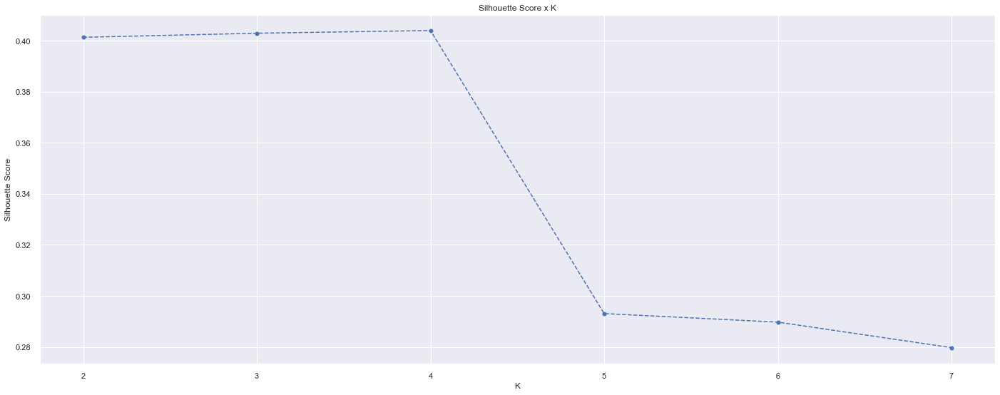

In [130]:
plt.plot( clusters, kmeans_list, linestyle='--', marker='o', color='b' )
plt.xlabel( 'K' );
plt.ylabel( 'Silhouette Score' );
plt.title( 'Silhouette Score x K' );

## 7.2. GMM

In [131]:
gmm_list = []
for k in clusters:
    # model definition
    gmm_model = mx.GaussianMixture( n_components=k )

    # model training
    gmm_model.fit( X )

    # model predict
    labels = gmm_model.predict( X )

    # model performance
    sil = m.silhouette_score( X, labels, metric='euclidean' )
    gmm_list.append( sil )
    print('Cicle:', k)

Cicle: 2
Cicle: 3
Cicle: 4
Cicle: 5
Cicle: 6
Cicle: 7


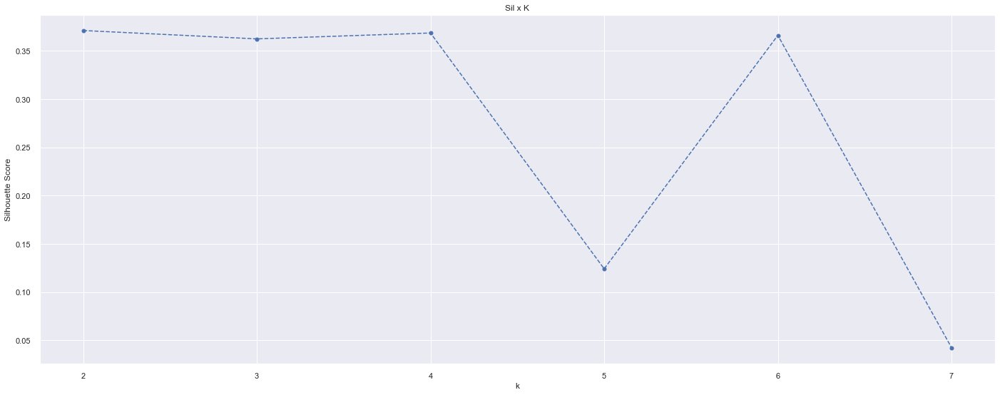

In [132]:
plt.plot( clusters, gmm_list, linestyle='--', marker='o', color='b' )
plt.xlabel( 'k');
plt.ylabel( 'Silhouette Score');
plt.title( 'Sil x K');

## 7.3. Hierarchical Clustering

In [133]:
from scipy.cluster import hierarchy as hc

In [134]:
# model definition and training
hc_model = hc.linkage( X, 'ward' )

[]

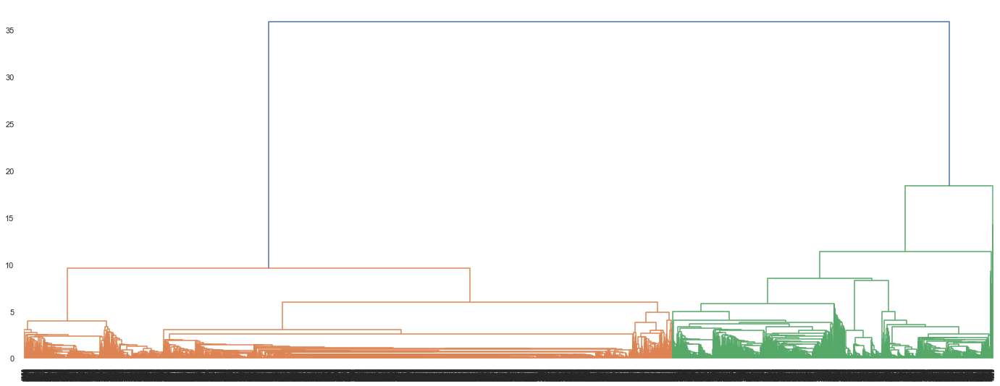

In [135]:
hc.dendrogram( 
    hc_model, 
    leaf_rotation=90,
    leaf_font_size=8
)

plt.plot()

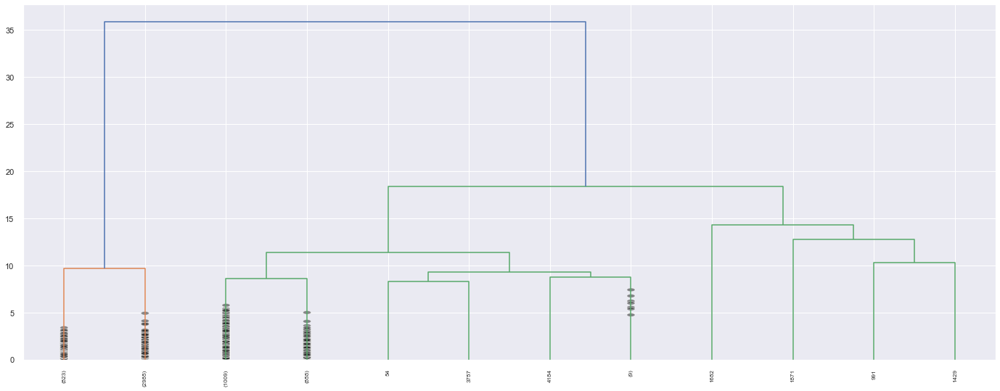

In [136]:
hc.dendrogram( 
    hc_model,
    truncate_mode='lastp',
    p=12,
    leaf_rotation=90,
    leaf_font_size=8,
    show_contracted=True
)

plt.show()

### 7.3.1. HClustering Silhouette Score

In [137]:
from sklearn import metrics as m

In [138]:
hc_list = []
for k in clusters:
    # model definition & training
    hc_model = hc.linkage( X, 'ward' )

    # model predict
    labels = hc.fcluster( hc_model, k, criterion='maxclust' )

    # metrics
    sil = m.silhouette_score( X, labels, metric='euclidean' )
    hc_list.append( sil )

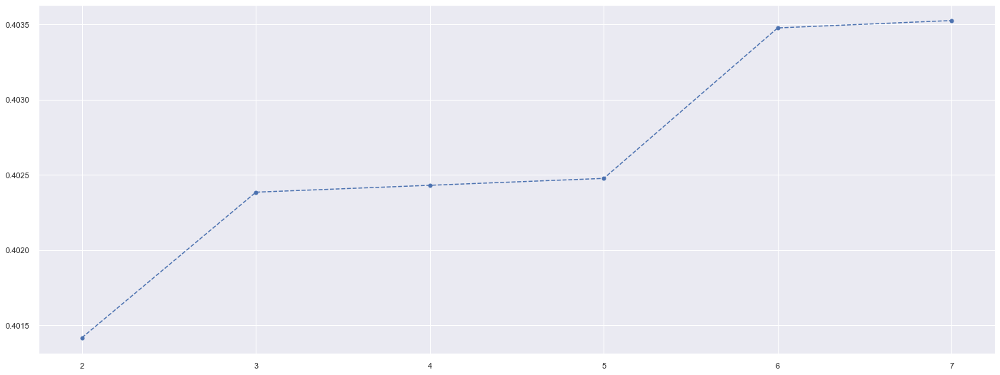

In [139]:
plt.plot( clusters,  hc_list, linestyle='--', marker='o', color='b' )

## 7.4. DBSCAN

In [211]:
eps=0.4
min_samples=3 

# model definition
dbscan_model = c.DBSCAN( eps=eps, min_samples=min_samples )

# mode training & predict 
labels = dbscan_model.fit_predict( X )

sil = m.silhouette_score( X, labels, metric='euclidean' )
print( 'Silhouette Score: {}'.format( sil ) )
print( 'Number of Clusters: {}'.format( len( unique( labels ) ) ) )
print( unique( labels ) )

Silhouette Score: 0.5643100105136276
Number of Clusters: 3
[-1  0  1]


In [212]:
from sklearn.neighbors import NearestNeighbors

In [213]:
neighbors = NearestNeighbors( n_neighbors=min_samples ).fit( X )
distances, indices = neighbors.kneighbors( X )

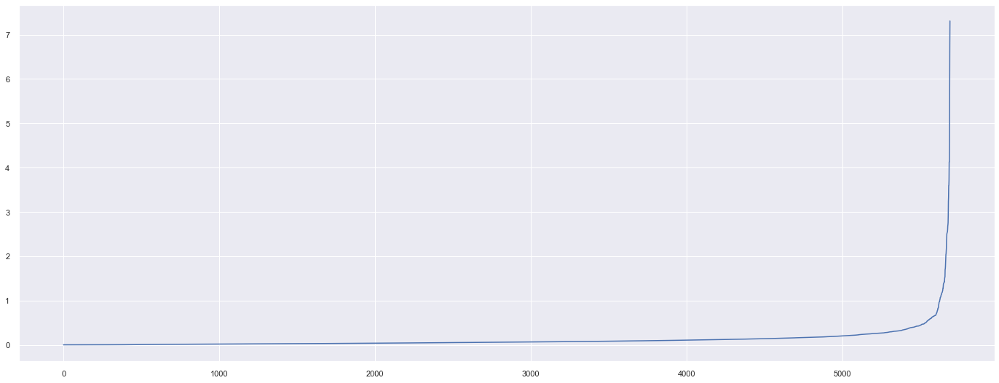

In [214]:
distances = np.sort( distances, axis=0 )
distances = distances[:,1]
plt.plot( distances )

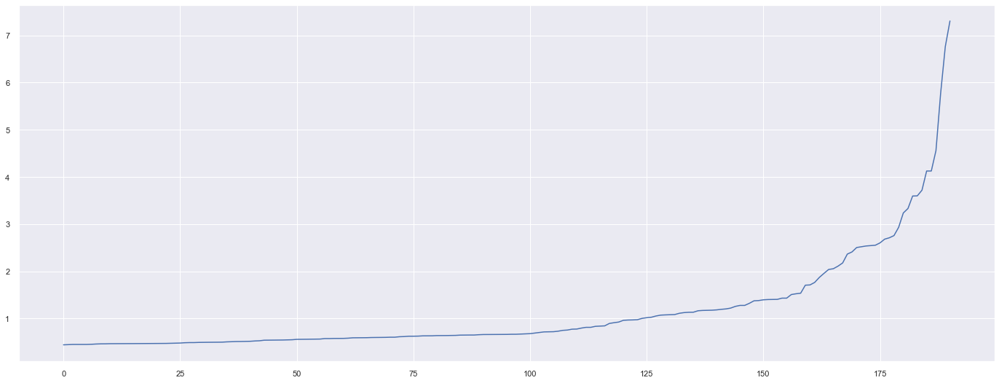

In [216]:
plt.plot( distances[5500:] )

In [38]:
dbscan_list = [ 0.622034, 0.000000, 0.000000, 0.000000, 0.000000, 0.000000]

## 7.5. Results

In [140]:
df_results = pd.DataFrame( 
    {'KMeans': kmeans_list, 
     'GMM': gmm_list, 
     'HC': hc_list, 
     #'DBSCAN': dbscan_list
    }
).T

df_results.columns = clusters

In [141]:
df_results.style.highlight_max( color='lightgreen', axis=1 )

,2,3,4,5,6,7
KMeans,0.401310,0.402903,0.403967,0.293090,0.289730,0.279746
GMM,0.371187,0.362520,0.368631,0.124217,0.366198,0.042557
HC,0.401418,0.402384,0.402430,0.402476,0.403475,0.403524


## 7.6. Silhouette Analysis

 For K = 2. Silhouette Score: 0.4014183477790531
 For K = 3. Silhouette Score: 0.4023844437538553
 For K = 4. Silhouette Score: 0.40243007737611763
 For K = 5. Silhouette Score: 0.40247591282427997
 For K = 6. Silhouette Score: 0.40347547920808724
 For K = 7. Silhouette Score: 0.40352444706762974


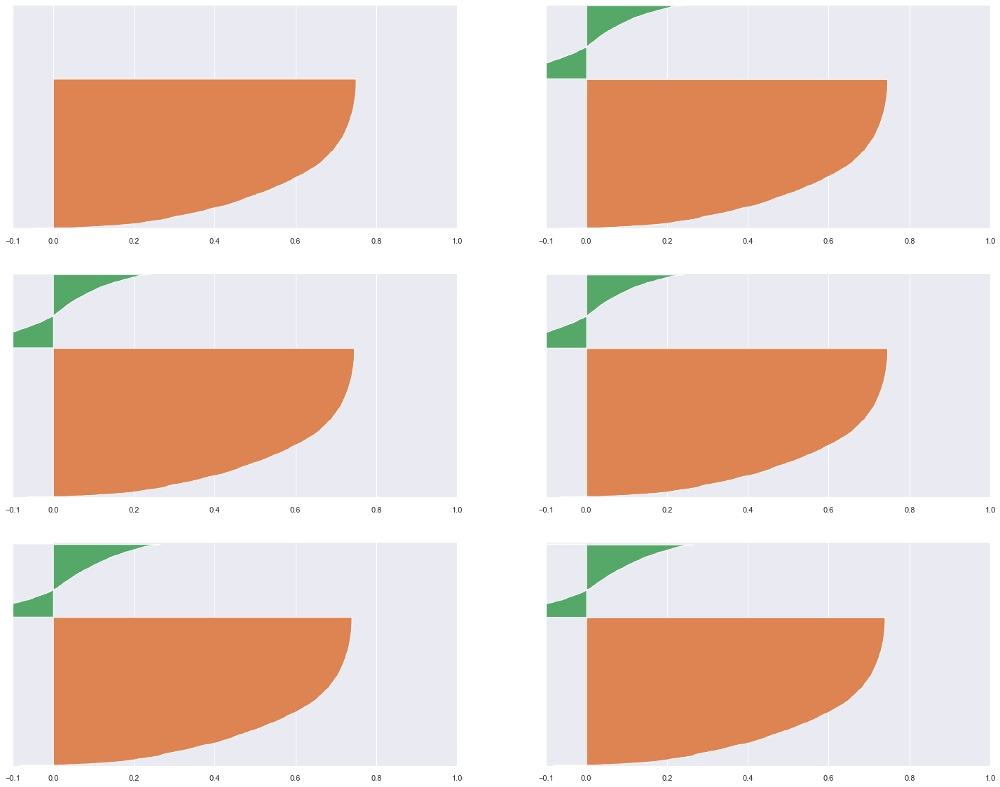

In [142]:
fig, ax = plt.subplots( 3, 2 )
fig.set_size_inches( 25, 20 )

for k in clusters:
    q, mod = divmod( k, 2 )
    
    ax[q-1, mod].set_xlim( [ -0.1, 1] )
    ax[q-1, mod].set_ylim( [ 0, len( X ) + ( k+1 )*10] )
    
    # model definition & training
    hc_model = hc.linkage( X, 'ward' )

    # model predict
    labels = hc.fcluster( hc_model, k, criterion='maxclust' )

    # performance
    ss = m.silhouette_score( X, labels, metric='euclidean' )
    print( ' For K = {}. Silhouette Score: {}'.format( k, ss ) )

    samples_silhouette_values = m.silhouette_samples( X, labels )

    y_lower = 10
    for i in range( k ):

        # select clusters
        ith_samples_silhouette_values = samples_silhouette_values[ labels == i]
        
        # sort values
        ith_samples_silhouette_values.sort()

        # size clusters
        size_cluster_i = ith_samples_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        cmap = cm.get_cmap( 'Spectral' )
        color = cmap( i / k )

        ax[q-1, mod].fill_betweenx( np.arange( y_lower, y_upper ), 0, ith_samples_silhouette_values  )
        
        y_lower = y_upper + 10
        
    ax[q-1, mod].set_yticks([])
    ax[q-1, mod].set_xticks( [-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

# <font color='red'> 8.0 HYPERPARAMETER FINE TUNNING </font>

## 8.1. K-Means

In [143]:
# model definition
k = 4
kmeans = c.KMeans(init='random', n_clusters=k, n_init=10, max_iter=300, random_state=42) #max_iter iterações para achar o centróide

# model training
kmeans.fit(X)

#clustering
labels = kmeans.labels_

## 8.2. Cluster Validation

In [144]:
## WSS (within-cluster sum of square)
print('WSS Values: {}'.format(kmeans.inertia_))

## SS (Silhouette Score)
print('SS Values: {}'.format(m.silhouette_score(X, labels, metric='euclidean')))

WSS Values: 2663.89895352175
SS Values: 0.2931662412358137


# <font color='red'> 9.0. Cluster Analysis </font>

In [145]:
df9 = df5_p.copy()
df9['cluster'] = labels
df9['customer_id'] = df5_p['customer_id']
df9.head()

,customer_id,quantity,unit_price,total_returned,manual_p,class_0,class_1,class_2,class_3,class_4,class_5,class_6,class_7,class_8,class_9,class_10,class_11,class_12,class_13,class_14,class_15,class_16,class_17,class_18,class_19,class_20,class_21,class_22,class_23,class_24,class_25,class_26,class_27,class_28,class_29,class_30,class_31,class_32,class_33,class_34,class_35,class_36,class_37,class_38,class_39,class_40,class_41,class_42,class_43,class_44,class_45,class_46,class_47,class_48,class_49,class_50,class_51,class_52,class_53,class_54,class_55,class_56,class_57,class_58,class_59,class_60,class_61,class_62,class_63,class_64,class_65,class_66,class_67,class_68,class_69,class_70,class_71,class_72,class_73,class_74,class_75,class_76,class_77,class_78,class_79,class_80,class_81,class_82,class_83,class_84,class_85,class_86,class_87,class_88,class_89,class_90,class_91,class_92,class_93,class_94,class_95,class_96,class_97,class_98,class_99,class_100,class_101,class_102,class_103,class_104,class_105,class_106,class_107,class_108,class_109,class_110,class_111,class_112,class_113,class_114,class_115,class_116,class_117,class_118,class_119,class_120,class_121,class_122,class_123,class_124,class_125,class_126,class_127,class_128,class_129,class_130,class_131,class_132,class_133,class_134,class_135,class_136,class_137,class_138,class_139,class_140,class_141,class_142,class_143,class_144,class_145,class_146,class_147,class_148,class_149,class_150,class_151,class_152,class_153,class_154,class_155,class_156,class_157,class_158,class_159,class_160,class_161,class_162,class_163,class_164,class_165,class_166,class_167,class_168,class_169,class_170,class_171,class_172,class_173,class_174,class_175,class_176,class_177,class_178,class_179,class_180,class_181,class_182,class_183,class_184,class_185,class_186,class_187,class_188,class_189,class_190,class_191,class_192,class_193,class_194,class_195,class_196,class_197,class_198,class_199,class_200,class_201,class_202,class_203,class_204,class_205,class_206,class_207,class_208,class_209,class_210,class_211,class_212,class_213,class_214,class_215,class_216,class_217,class_218,class_219,class_220,class_221,class_222,class_223,class_224,class_225,class_226,class_227,class_228,class_229,class_230,class_231,class_232,class_233,class_234,class_235,class_236,class_237,class_238,class_239,class_240,class_241,class_242,class_243,class_244,class_245,class_246,class_247,class_248,class_249,class_250,class_251,class_252,class_253,class_254,class_255,class_256,class_257,class_258,class_259,class_260,class_261,class_262,class_263,class_264,class_265,class_266,class_267,class_268,class_269,class_270,class_271,class_272,class_273,class_274,class_275,class_276,class_277,class_278,class_279,class_280,class_281,class_282,class_283,class_284,class_285,class_286,class_287,class_288,class_289,class_290,class_291,class_292,class_293,class_294,class_295,class_296,class_297,class_298,class_299,class_300,class_301,class_302,class_303,class_304,class_305,class_306,class_307,class_308,class_309,class_310,class_311,class_312,class_313,class_314,class_315,class_316,class_317,class_318,class_319,class_320,class_321,class_322,class_323,class_324,class_325,class_326,class_327,class_328,class_329,class_330,class_331,class_332,class_333,class_334,class_335,class_336,class_337,class_338,class_339,class_340,class_341,class_342,class_343,class_344,class_345,class_346,class_347,class_348,class_349,class_350,class_351,class_352,class_353,class_354,class_355,class_356,class_357,class_358,class_359,class_360,class_361,class_362,class_363,class_364,class_365,class_366,class_367,class_368,class_369,class_370,class_371,class_372,class_373,class_374,class_375,class_376,class_377,class_378,class_379,class_380,class_381,class_382,class_383,class_384,class_385,class_386,class_387,class_388,class_389,class_390,class_391,class_392,class_393,class_394,class_395,class_396,class_397,class_398,class_399,class_400,class_401,class_402,class_403,class_404,cla

In [146]:
df9.shape

(5691, 974)

## 9.1. Visualization Inspection

In [147]:
fig = px.scatter_3d(df9, x='customer_by_day', y='total_gross_revenue_adj', z='total_invoices', color='cluster')
fig.show()

## 9.2. 2d plot

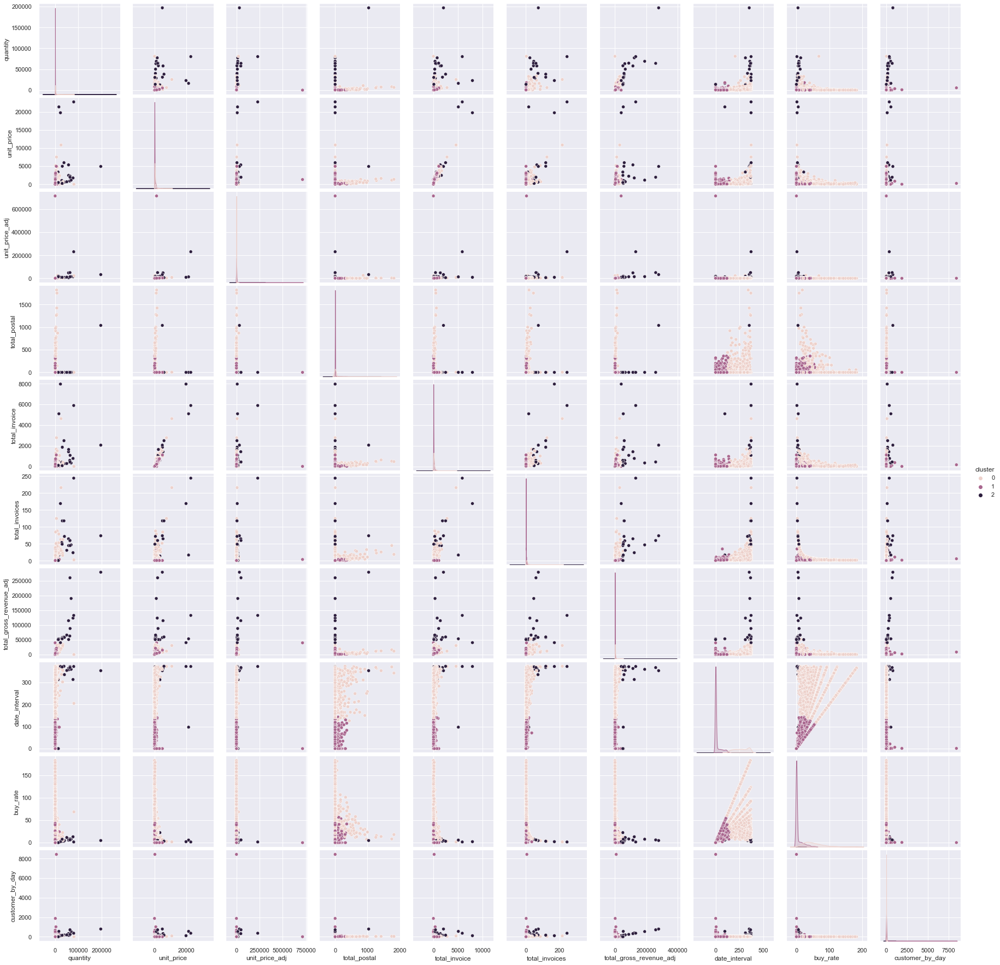

In [229]:
df_viz = df9.drop( columns='customer_id', axis=1 )
sns.pairplot( df_viz, hue='cluster' )

## 9.1. Cluster Profile

In [230]:
df9.columns

Index(['customer_id', 'quantity', 'unit_price', 'unit_price_adj',
       'total_postal', 'total_invoice', 'total_invoices',
       'total_gross_revenue_adj', 'date_interval', 'buy_rate',
       'customer_by_day', 'cluster'],
      dtype='object')

In [148]:
df_cluster = pd.DataFrame()
# Number of customer
df_cluster = df9[['customer_id', 'cluster']].groupby('cluster').count().reset_index().rename(columns={'customer_id': 'total_customers'})
df_cluster['perc_customer'] = 100*(df_cluster['total_customers'] / df_cluster['total_customers'].sum())

# Avg quantity
df_avg_avg_qt = df9[['quantity', 'cluster']].groupby('cluster').mean().reset_index()
df_cluster = pd.merge(df_cluster, df_avg_avg_qt, how='inner', on='cluster')

# Avg total postal
df_avg_total_postal = df9[['total_postal', 'cluster']].groupby('cluster').mean().reset_index()
df_cluster = pd.merge(df_cluster, df_avg_total_postal, how='inner', on='cluster')

# Avg invoice
df_avg_invoice_no = df9[['total_invoices', 'cluster']].groupby('cluster').mean().reset_index()
df_cluster = pd.merge(df_cluster, df_avg_invoice_no, how='inner', on='cluster')

# Avg total_gross_revenue_adj
df_avg_gav_ajd = df9[['total_gross_revenue_adj', 'cluster']].groupby('cluster').mean().reset_index()
df_cluster = pd.merge(df_cluster, df_avg_gav_ajd, how='inner', on='cluster')

# Avg date_interval
df_avg_gav_ajd = df9[['date_interval', 'cluster']].groupby('cluster').mean().reset_index()
df_cluster = pd.merge(df_cluster, df_avg_gav_ajd, how='inner', on='cluster')

# Avg buy_rate
df_avg_gav_ajd = df9[['buy_rate', 'cluster']].groupby('cluster').mean().reset_index()
df_cluster = pd.merge(df_cluster, df_avg_gav_ajd, how='inner', on='cluster')

# Avg customer_by_day
df_avg_gav_ajd = df9[['customer_by_day', 'cluster']].groupby('cluster').mean().reset_index()
df_cluster = pd.merge(df_cluster, df_avg_gav_ajd, how='inner', on='cluster')


In [149]:
df_cluster.sort_values('customer_by_day', ascending=False)

,cluster,total_customers,perc_customer,quantity,total_postal,total_invoices,total_gross_revenue_adj,date_interval,buy_rate,customer_by_day
2,2,7,0.12,85492.86,148.29,80.29,121386.29,357.00,6.74,343.13
1,1,1171,20.58,2401.03,29.86,11.21,4168.34,316.91,50.73,12.58
0,0,3448,60.59,317.96,2.86,1.47,753.39,7.93,2.70,11.85
3,3,1065,18.71,931.14,17.08,4.31,1334.18,170.58,49.82,8.34


### Cluster 01:  ( Candidate for Insiders )
    - Number of Customers: 20 (0,35% of customers )
    - Avg Invoice: 65,35
    - Avg Gross Revenue Adjusted: $94.772,63	
        
### Cluster 02: (New customers with low invoice)
    - Number of Customers: 3704 (65,09% of customers )
    - Avg Invoice: 1,61
    - Avg Gross Revenue Adjusted: $762,10
        
### Cluster 03: (Old customers with low revenue)
    - Number of Customers: 1967 (34,56% of customers )
    - Avg Invoice: 8,08
    - Avg Gross Revenue Adjusted: $2.580,80

In [150]:
df9[df9['cluster'] == 2].sort_values('customer_by_day', ascending=False)

,customer_id,quantity,unit_price,total_returned,manual_p,class_0,class_1,class_2,class_3,class_4,class_5,class_6,class_7,class_8,class_9,class_10,class_11,class_12,class_13,class_14,class_15,class_16,class_17,class_18,class_19,class_20,class_21,class_22,class_23,class_24,class_25,class_26,class_27,class_28,class_29,class_30,class_31,class_32,class_33,class_34,class_35,class_36,class_37,class_38,class_39,class_40,class_41,class_42,class_43,class_44,class_45,class_46,class_47,class_48,class_49,class_50,class_51,class_52,class_53,class_54,class_55,class_56,class_57,class_58,class_59,class_60,class_61,class_62,class_63,class_64,class_65,class_66,class_67,class_68,class_69,class_70,class_71,class_72,class_73,class_74,class_75,class_76,class_77,class_78,class_79,class_80,class_81,class_82,class_83,class_84,class_85,class_86,class_87,class_88,class_89,class_90,class_91,class_92,class_93,class_94,class_95,class_96,class_97,class_98,class_99,class_100,class_101,class_102,class_103,class_104,class_105,class_106,class_107,class_108,class_109,class_110,class_111,class_112,class_113,class_114,class_115,class_116,class_117,class_118,class_119,class_120,class_121,class_122,class_123,class_124,class_125,class_126,class_127,class_128,class_129,class_130,class_131,class_132,class_133,class_134,class_135,class_136,class_137,class_138,class_139,class_140,class_141,class_142,class_143,class_144,class_145,class_146,class_147,class_148,class_149,class_150,class_151,class_152,class_153,class_154,class_155,class_156,class_157,class_158,class_159,class_160,class_161,class_162,class_163,class_164,class_165,class_166,class_167,class_168,class_169,class_170,class_171,class_172,class_173,class_174,class_175,class_176,class_177,class_178,class_179,class_180,class_181,class_182,class_183,class_184,class_185,class_186,class_187,class_188,class_189,class_190,class_191,class_192,class_193,class_194,class_195,class_196,class_197,class_198,class_199,class_200,class_201,class_202,class_203,class_204,class_205,class_206,class_207,class_208,class_209,class_210,class_211,class_212,class_213,class_214,class_215,class_216,class_217,class_218,class_219,class_220,class_221,class_222,class_223,class_224,class_225,class_226,class_227,class_228,class_229,class_230,class_231,class_232,class_233,class_234,class_235,class_236,class_237,class_238,class_239,class_240,class_241,class_242,class_243,class_244,class_245,class_246,class_247,class_248,class_249,class_250,class_251,class_252,class_253,class_254,class_255,class_256,class_257,class_258,class_259,class_260,class_261,class_262,class_263,class_264,class_265,class_266,class_267,class_268,class_269,class_270,class_271,class_272,class_273,class_274,class_275,class_276,class_277,class_278,class_279,class_280,class_281,class_282,class_283,class_284,class_285,class_286,class_287,class_288,class_289,class_290,class_291,class_292,class_293,class_294,class_295,class_296,class_297,class_298,class_299,class_300,class_301,class_302,class_303,class_304,class_305,class_306,class_307,class_308,class_309,class_310,class_311,class_312,class_313,class_314,class_315,class_316,class_317,class_318,class_319,class_320,class_321,class_322,class_323,class_324,class_325,class_326,class_327,class_328,class_329,class_330,class_331,class_332,class_333,class_334,class_335,class_336,class_337,class_338,class_339,class_340,class_341,class_342,class_343,class_344,class_345,class_346,class_347,class_348,class_349,class_350,class_351,class_352,class_353,class_354,class_355,class_356,class_357,class_358,class_359,class_360,class_361,class_362,class_363,class_364,class_365,class_366,class_367,class_368,class_369,class_370,class_371,class_372,class_373,class_374,class_375,class_376,class_377,class_378,class_379,class_380,class_381,class_382,class_383,class_384,class_385,class_386,class_387,class_388,class_389,class_390,class_391,class_392,class_393,class_394,class_395,class_396,class_397,class_398,class_399,class_400,class_401,class_402,class_403,class_404,cla

In [151]:
df9[df9['cluster'] == 1].sort_values('total_gross_revenue_adj', ascending=False).head(10)

customer_id  quantity  unit_price  total_returned  manual_p  class_0  class_1  class_2  class_3  class_4  class_5  class_6  class_7  class_8  class_9  class_10  class_11  class_12  class_13  class_14  class_15  class_16  class_17  class_18  class_19  class_20  class_21  class_22  class_23  class_24  class_25  class_26  class_27  class_28  class_29  class_30  class_31  class_32  class_33  class_34  class_35  class_36  class_37  class_38  class_39  class_40  class_41  class_42  class_43  class_44  class_45  class_46  class_47  class_48  class_49  class_50  class_51  class_52  class_53  class_54  class_55  class_56  class_57  class_58  class_59  class_60  class_61  class_62  class_63  class_64  class_65  class_66  class_67  class_68  class_69  class_70  class_71  class_72  class_73  class_74  class_75  class_76  class_77  class_78  class_79  class_80  class_81  class_82  class_83  class_84  class_85  class_86  class_87  class_88  class_89  class_90  class_91  class_92  class_93  class_94  class_95  class_96  class_97  class_98  class_99  class_100  class_101  class_102  class_103  class_104  class_105  class_106  class_107  class_108  class_109  class_110  class_111  class_112  class_113  class_114  class_115  class_116  class_117  class_118  class_119  class_120  class_121  class_122  class_123  class_124  class_125  class_126  class_127  class_128  class_129  class_130  class_131  class_132  class_133  class_134  class_135  class_136  class_137  class_138  class_139  class_140  class_141  class_142  class_143  class_144  class_145  class_146  class_147  class_148  class_149  class_150  class_151  class_152  class_153  class_154  class_155  class_156  class_157  class_158  class_159  class_160  class_161  class_162  class_163  class_164  class_165  class_166  class_167  class_168  class_169  class_170  class_171  class_172  class_173  class_174  class_175  class_176  class_177  class_178  class_179  class_180  class_181  class_182  class_183  class_184  class_185  class_186  class_187  class_188  class_189  class_190  class_191  class_192  class_193  class_194  class_195  class_196  class_197  class_198  class_199  class_200  class_201  class_202  class_203  class_204  class_205  class_206  class_207  class_208  class_209  class_210  class_211  class_212  class_213  class_214  class_215  class_216  class_217  class_218  class_219  class_220  class_221  class_222  class_223  class_224  class_225  class_226  class_227  class_228  class_229  class_230  class_231  class_232  class_233  class_234  class_235  class_236  class_237  class_238  class_239  class_240  class_241  class_242  class_243  class_244  class_245  class_246  class_247  class_248  class_249  class_250  class_251  class_252  class_253  class_254  class_255  class_256  class_257  class_258  class_259  class_260  class_261  class_262  class_263  class_264  class_265  class_266  class_267  class_268  class_269  class_270  class_271  class_272  class_273  class_274  class_275  class_276  class_277  class_278  class_279  class_280  class_281  class_282  class_283  class_284  class_285  class_286  class_287  class_288  class_289  class_290  class_291  class_292  class_293  class_294  class_295  class_296  class_297  class_298  class_299  class_300  class_301  class_302  class_303  class_304  class_305  class_306  class_307  class_308  class_309  class_310  class_311  class_312  class_313  class_314  class_315  class_316  class_317  class_318  class_319  class_320  class_321  class_322  class_323  class_324  class_325  class_326  class_327  class_328  class_329  class_330  class_331  class_332  class_333  class_334  class_335  class_336  class_337  class_338  class_339  class_340  class_341  class_342  class_343  class_344  class_345  class_346  class_347  class_348  class_349  class_350  class_351  class_352  class_353  class_354  class_355  class_356  class_357  class_358  class_359  class_360  class_361  class_362  class_363  class_364  class_365  class_366  class_367  c

In [241]:
df2[df2['customer_id'] == 18102]

,invoice_no,stock_code,quantity,invoice_date,unit_price,country,description,customer_id,gross_revenue,good_return,qtd_adjustment,free_purchase,normal_purchase
16418,537657,82484,408,2016-12-05,4.78,United Kingdom,WOOD BLACK BOARD ANT WHITE FINISH,18102,1950.24,0,0,0,1
16419,537657,22830,30,2016-12-05,19.84,United Kingdom,UTILTY CABINET WITH HOOKS,18102,595.20,0,0,0,1
16420,537657,22189,972,2016-12-05,2.31,United Kingdom,CREAM HEART CARD HOLDER,18102,2245.32,0,0,0,1
16421,537657,22188,972,2016-12-05,2.31,United Kingdom,BLACK HEART CARD HOLDER,18102,2245.32,0,0,0,1
16422,537657,21623,408,2016-12-05,6.38,United Kingdom,VINTAGE UNION JACK MEMOBOARD,18102,2603.04,0,0,0,1
16423,537658,82484,48,2016-12-05,4.78,United Kingdom,WOOD BLACK BOARD ANT WHITE FINISH,18102,229.44,0,0,0,1
16424,537658,22189,36,2016-12-05,2.31,United Kingdom,CREAM HEART CARD HOLDER,18102,83.16,0,0,0,1
16425,537658,22188,36,2016-12-05,2.31,United Kingdom,BLACK HEART CARD HOLDER,18102,83.16,0,0,0,1
16426,537659,22765,23,2016-12-05,9.89,United Kingdom,NEWSPAPER STAND,18102,227.47,0,0,0,1
16427,537659,22507,208,2016-12-05,3.86,United Kingdom,MEMO BOARD RETROSPOT DESIGN,18102,802.88,0,0,0,1


# <font color='red'> 10.0. Deploy To Production </font>